# Tutorial 'QC, topographical analysis and segmentaton-free of Spot-based transcriptomics data'

In [1]:
%load_ext autoreload
%autoreload 2

## Make screen wider, add planktonpy folder to system path to enable import:

from IPython.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

import sys
import os

sys.path.append(os.path.join(os.path.abspath('.'),'../..'))

### data import:

In [2]:
import plankton.plankton as pl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def figure(width=6,height=6):
    plt.figure(figsize=(width,height))


In [3]:
um_p_px = 0.325

# Read coordinate/gene data from .csv file
coordinates = pd.read_csv('./data/in_situ_sequencing/coordinates.csv')
coordinates

,Gene,Global_y_pos,Global_x_pos,Q,parentCell
0,FLT1,4909.911982,1190.493724,1190.493724,1190.493724
1,FLT1,4908.912407,1194.492023,1194.492023,1194.492023
2,JAG2,4852.936212,1614.313488,1614.313488,1614.313488
3,RSPO2,4940.898805,1634.304986,1634.304986,1634.304986
4,SPRY1,4982.880951,1759.251850,1759.251850,1759.251850
...,...,...,...,...,...
494144,MET,11432.138303,9209.083692,9209.083692,9209.083692
494145,FGFR4,10289.624175,9292.048410,9292.048410,9292.048410
494146,FGFR4,11295.196539,9343.026730,9343.026730,9343.026730
494147,DTX1,13125.418209,9475.970194,9475.970194,9475.970194


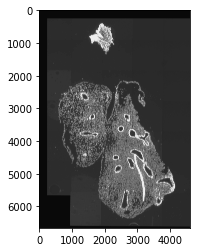

In [4]:
# Load staining image as .jpg:

bg = -plt.imread('background.jpg').mean(-1)
bg = (bg-bg.min())/(bg.max()-bg.min())

plt.imshow(bg,cmap='Greys')

In [5]:
# sdata.scatter_js() 

## ...and the stage is yours!

In [6]:
# Create a plankton-SpatialData object with the coordinates:

sdata = pl.SpatialData(
                        coordinates.Gene,
                        coordinates.Global_x_pos*um_p_px,
                        coordinates.Global_y_pos*um_p_px,
                        )

#show HTML representation:
sdata

,g,x,y,gene_id
0,FLT1,386.910460,1595.721394,47
1,FLT1,388.209908,1595.396532,47
2,JAG2,524.651884,1577.204269,69
3,RSPO2,531.149120,1605.792112,107
4,SPRY1,571.756851,1619.436309,120
...,...,...,...,...
494144,MET,2992.952200,3715.444948,81
494145,FGFR4,3019.915733,3344.127857,46
494146,FGFR4,3036.483687,3670.938875,46
494147,DTX1,3079.690313,4265.760918,25


In [7]:
# inspect 'stats' info frame:

sdata.stats

,counts,count_ranks,count_indices,gene_ids
AP000561,656,24,138,0
ARIH1,9550,132,10,1
ATP11A,2449,71,24,2
BCL2,3734,97,137,3
BMP5,13684,138,25,4
...,...,...,...,...
WNT2,114,3,89,137
WNT2B,17,0,4,138
WNT5A,792,30,88,139
WNT7B,993,35,13,140


<AxesSubplot:>

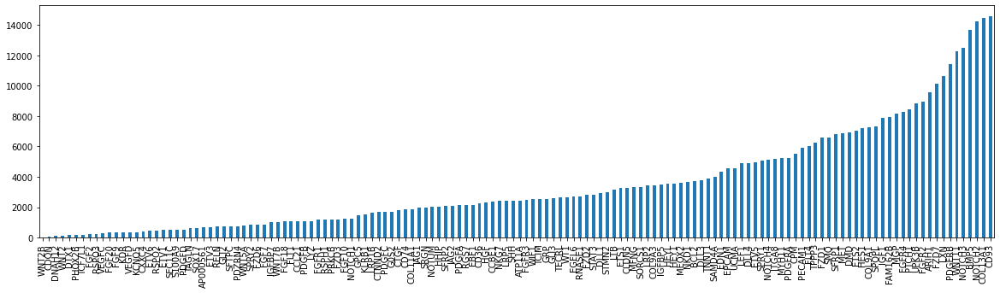

In [8]:
# Plot a representation of the gene counts in the data set:

plt.figure(figsize=(20,5))
sdata.counts.sort_values().plot.bar()

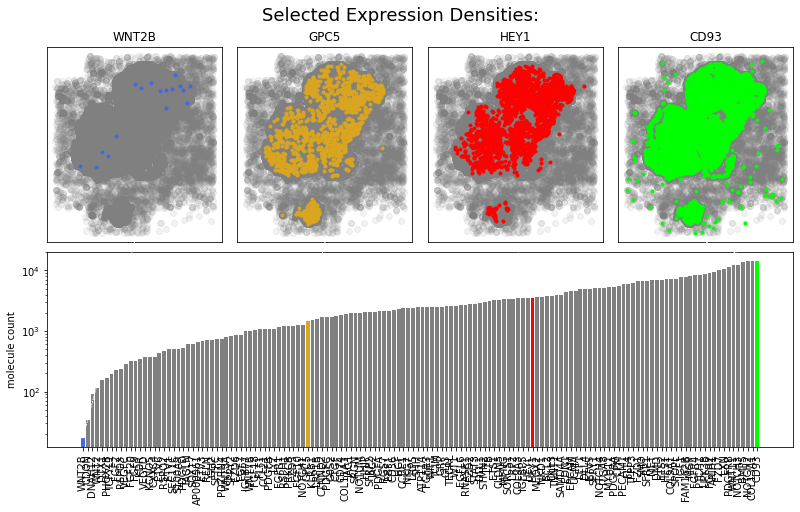

In [9]:
# Plot 'overview' data set summary:
sdata.plot_overview()

(<matplotlib.collections.PathCollection at 0x7fec8c1b0700>, None, None)

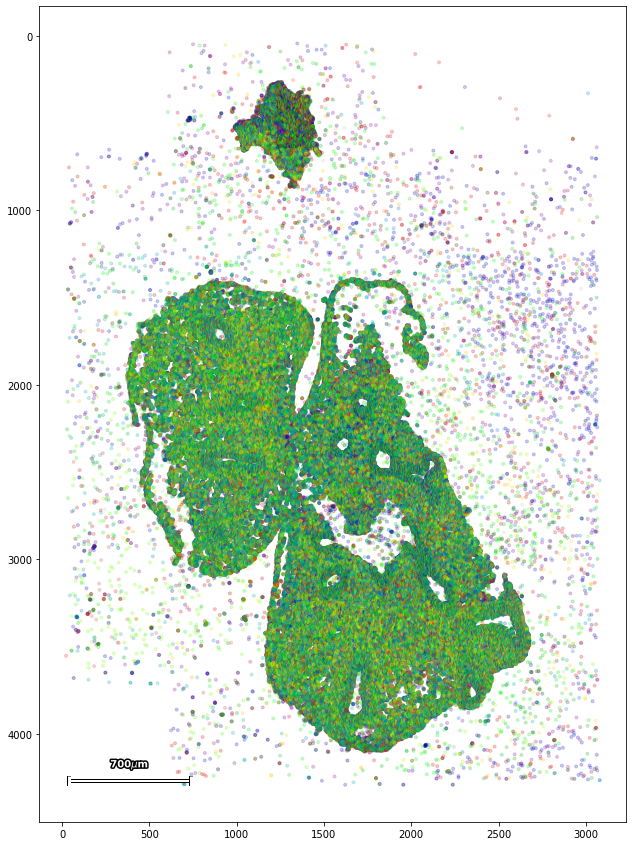

In [10]:
# use the 'scatter' function to get familiar with the data set:

plt.figure(figsize=(15,15))

sdata.scatter(alpha=0.2)

#### Adding a pixel map as background image:

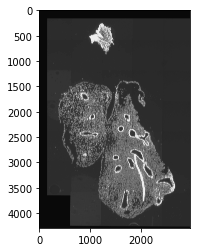

In [11]:
bg_map = pl.PixelMap(pixel_data=bg,
                     cmap='Greys',
                     px_p_um = 0.504/um_p_px)
bg_map.imshow()

# del bg

In [12]:
sdata = pl.SpatialData(
                        coordinates.Gene,
                        coordinates.Global_x_pos*um_p_px,
                        coordinates.Global_y_pos*um_p_px,
                        pixel_maps={'DAPI':bg_map}
                        )

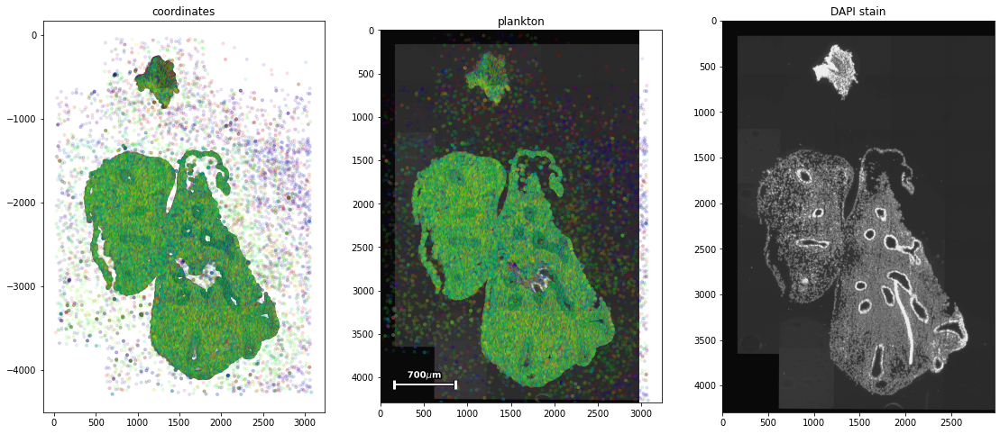

In [13]:
plt.figure(figsize=(19,8))

plt.subplot(1,3,1)
plt.title('coordinates')
plt.scatter(*sdata.coordinates[:,:].T*np.array([[1],[-1]]),c=sdata.obsc.c_genes[sdata.gene_ids],marker='.',alpha=0.1)

plt.subplot(1,3,2)
plt.title('plankton')
sdata.scatter(alpha=0.1)

ax=plt.subplot(1,3,3)
plt.title('DAPI stain')
bg_map.imshow(axd=ax)

In [14]:
sdata.pixel_maps['DAPI'].extent

(0.0, 4292.063492063492, 0.0, 2971.4285714285716)

#### basic slicing functionality:

(<matplotlib.collections.PathCollection at 0x7fec8bf100d0>, None, None)

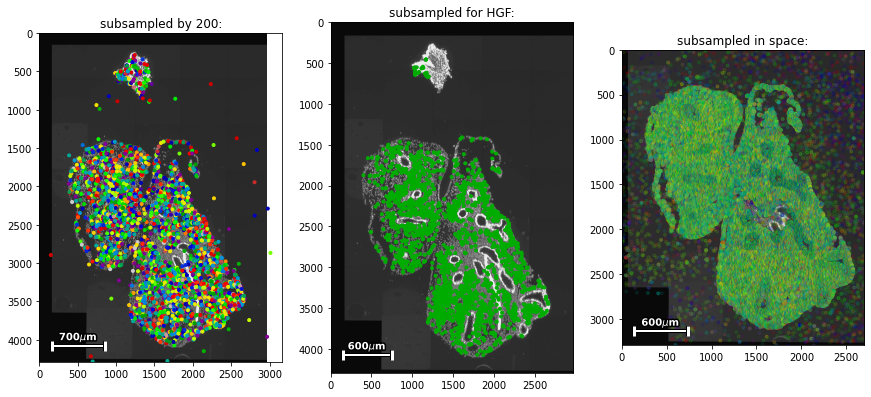

In [15]:
plt.figure(figsize=(20,7))


# Slice using array notation:
plt.subplot(1,4,1)
plt.title('subsampled by 200:')
sdata[::200].scatter()

# Subsample using boolean mask:
plt.subplot(1,4,2)
plt.title('subsampled for HGF:')
sdata[sdata.g=='HGF'].scatter()

# Subsample using spatial view:
plt.subplot(1,4,3)
plt.title('subsampled in space:')
sdata.spatial[100:2800,1000:].scatter(alpha=0.1)


## Task:

use pands.Series.isin to plot all genes that occur below 50 times in the sample. 

(<matplotlib.collections.PathCollection at 0x7fec8bdcdf70>,
 None,
 <matplotlib.legend.Legend at 0x7fec8be344c0>)

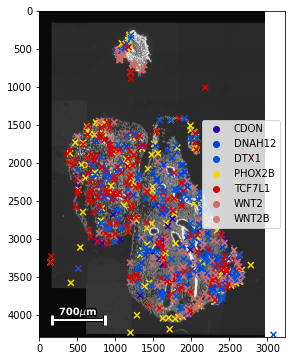

In [16]:
figure()
sdata[(sdata.counts<200)[sdata.gene_ids]].scatter(marker='x',legend=True)

## some basic statistical analysis using squidpy:

In [17]:
# Perform subsampling to reduce runtime (for the sake of this tutorial...)
prog_sample = sdata.stats.progressive_sample(1.1)

sdata = sdata[prog_sample]

In [18]:
from plankton.utils import hbar_compare

figure()
hbar_compare(sdata.stats,sdata_.stats,('raw','downsampled'))

NameError: name 'sdata_' is not defined

<Figure size 432x432 with 0 Axes>

In [ ]:
figure(15,5)
sdata.counts.sort_values().plot.bar()
sdata[prog_sample].counts.sort_values().plot.bar(color='r')

In [39]:
import squidpy as sq

# Compute neighborhood graph:
sq.gr.spatial_neighbors(sdata_,'spatial')


  0%|          | 0/1000 [00:00<?, ?/s]

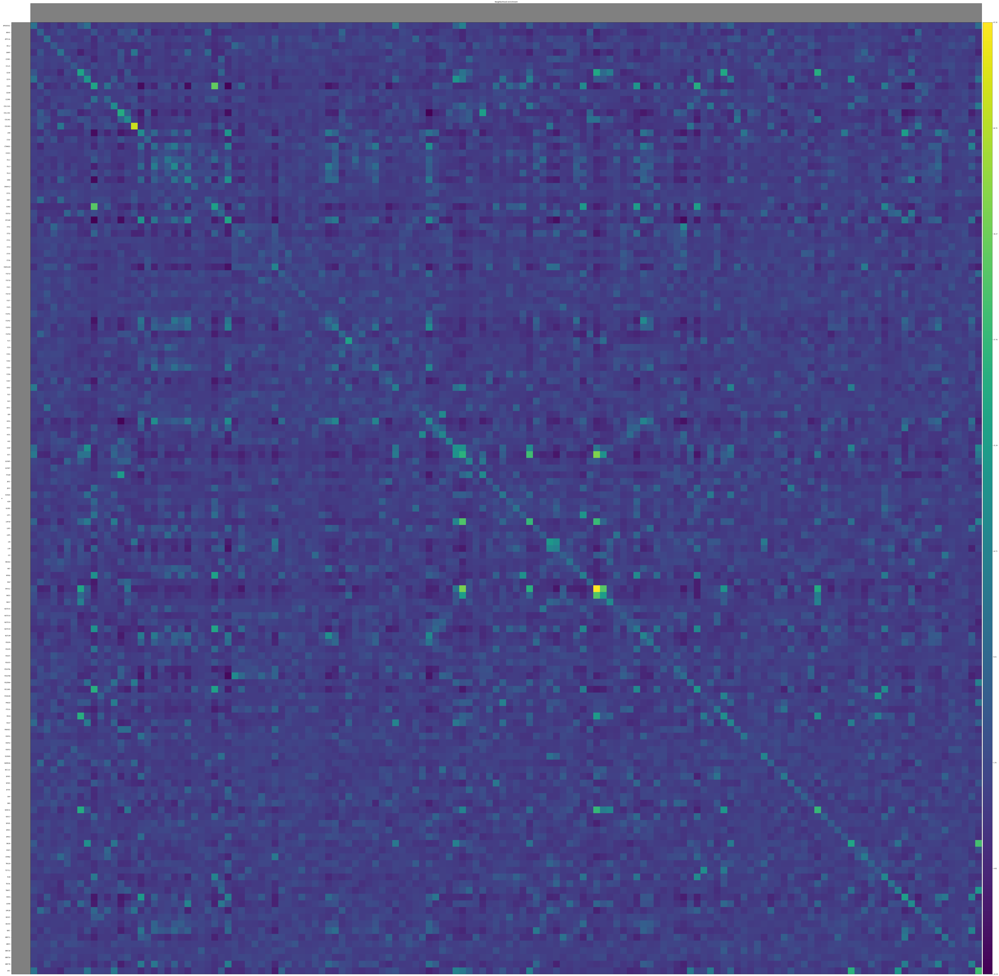

In [40]:

# Compute neighborhood enrichment through permutation:
sq.gr.nhood_enrichment(sdata_,'g')

sq.pl.nhood_enrichment(sdata_,'g')

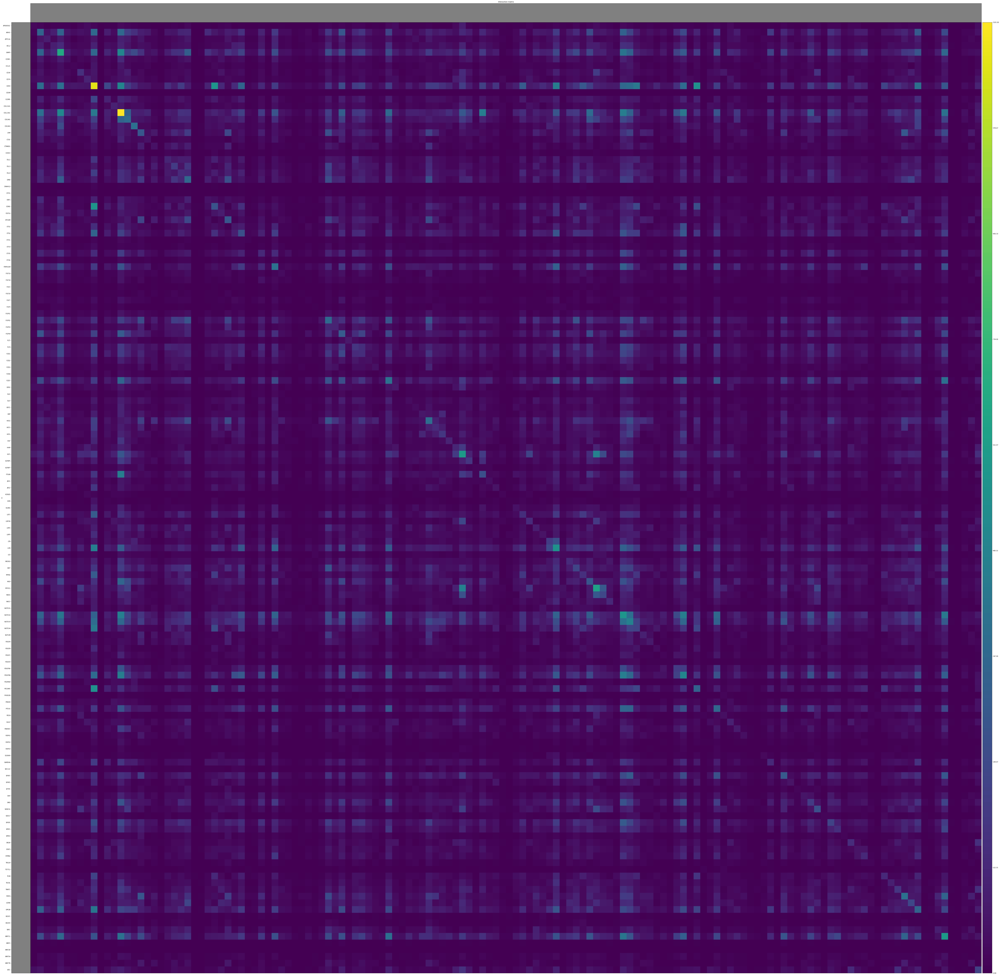

In [41]:
im=sq.gr.interaction_matrix(sdata_,'g')
sq.pl.interaction_matrix(sdata_,'g')

(<matplotlib.collections.PathCollection at 0x7fa371aa1640>, None, None)

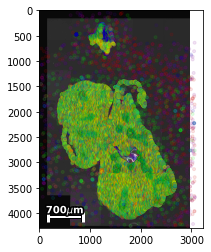

In [45]:
sdata[((sdata_.uns['g_interactions']>100)[22])[sdata.gene_ids]].scatter(alpha=0.1)
# import plankton
# isinstance(sdata.background, plankton.pixelmaps.PixelMap)

# type(sdata.background)

In [53]:
plt.style.use('default')
count_ratios = (sdata.counts**0.9/sdata.counts)

sample_mask = np.ones((len(sdata,)),dtype=bool)



for i,c in enumerate(count_ratios):
    sample_array = np.linspace(0,1,sdata.counts[i])
    np.random.shuffle(sample_array)
    sample_mask[sdata.gene_ids==i] = sample_array<c
    
sdata_downsampled = sdata[sample_mask]

<AxesSubplot:ylabel='counts'>

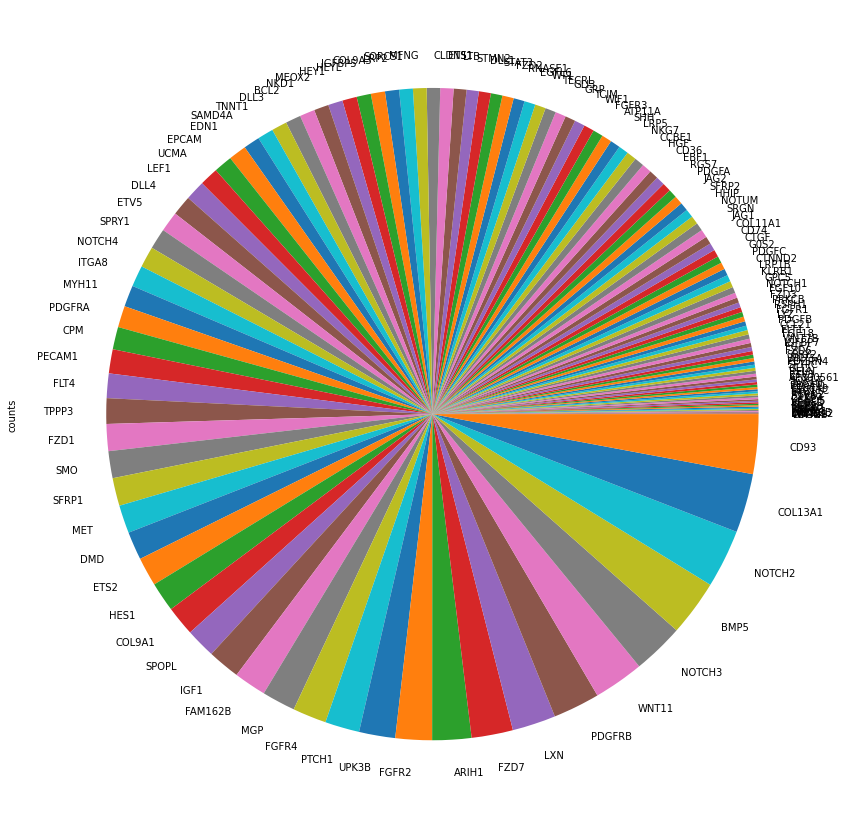

In [21]:
plt.figure(figsize=(15,15))
sdata.counts.sort_values().plot.pie()

(<matplotlib.collections.PathCollection at 0x7fc24274bdc0>, None, None)

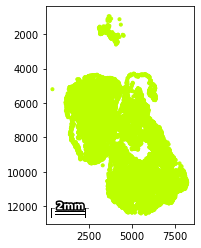

In [22]:
sdata[sdata.g=='NOTCH2'].scatter()

In [13]:
markers = {'mesenchymal':['COL1A2','COL1A3','COL6A3','ACTA2','PDGFR8','WT1',
                        'TSH22','CDH11','CCBE1','UNC5C','COL1A1','RSPO2','DCN'],
           
           'endothelial':['CDH5','PROX1','CLDN5','PECAM1','CD93','PRKCH','VWF','ARHGAP18','FLT1'],
          
           'immune':['PTPRC','MCTP1','AIF1','CD74','KYNU',
                    'RBM47','CCL4','CCL3','HLA-DRA',],
          
           'megakaryocyte':['TUBB1','RGB18','PSTPIP2','PF4','ITGA2B',
                            'FERMT3',],
          
           'RBC':['GYPA','SLC25A37','ALAS2','HBM','AHSP','SFTA3',
                    'FREM2','KRT19','PPP1R9A','CPM','SHANK2',
                    'DC0D2','CTNND2','LMO7',],
          
           'epithelial':['EPCAM',],
          
           'neuronal':['ASCL1']}

## Publicized Fig. 8

showing markers for identified cell types:

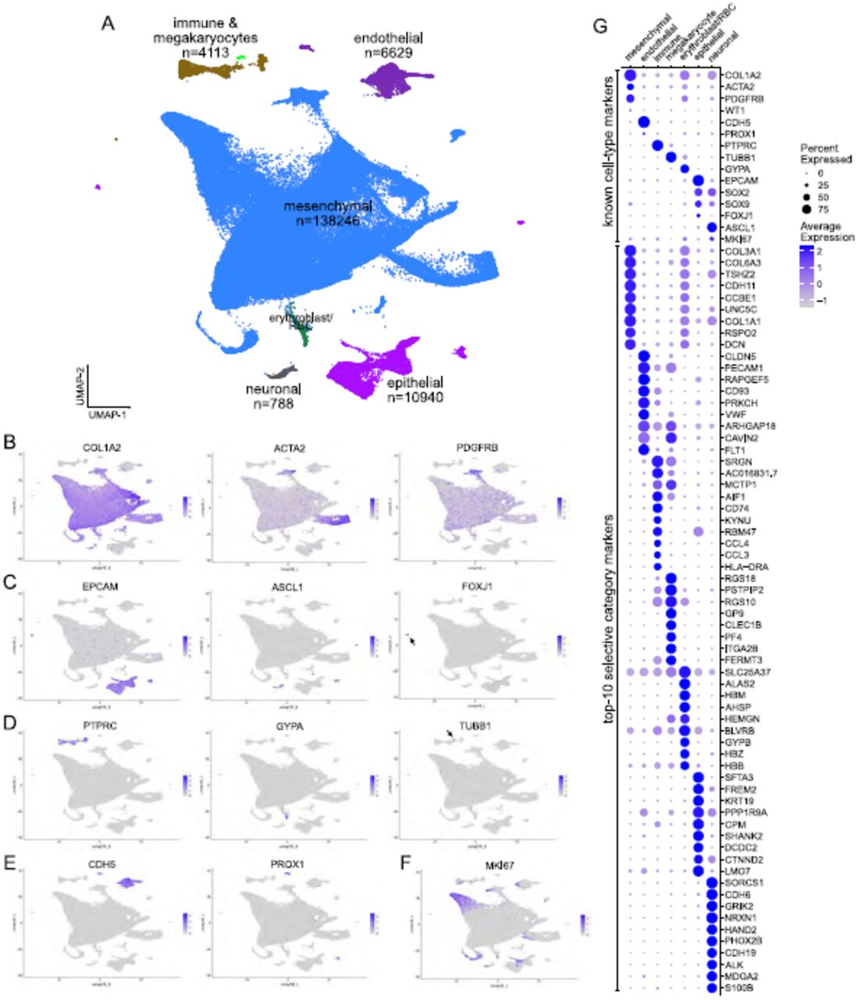

(<matplotlib.collections.PathCollection at 0x7f258fb7a460>, None, None)

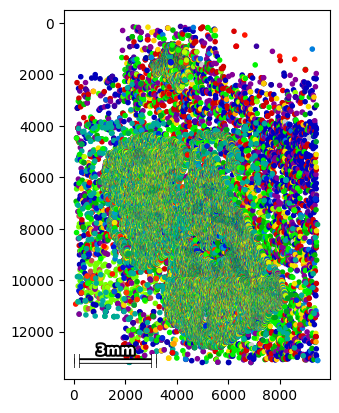

In [9]:
sdata.scatter()

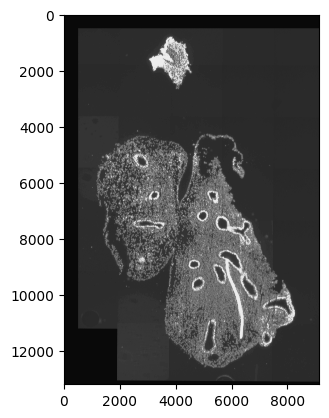

In [11]:
sdata = pl.SpatialData(genes=coordinates.Gene,
                        x_coordinates=coordinates.Global_x_pos,
                        y_coordinates=coordinates.Global_y_pos,
#                        scanpy=adata,
                      pixel_maps = {'background_DAPI':bg_map})

In [31]:
sdata_downsampled.graph.update_knn(n_neighbors=150)
models = sdata_downsampled.graph._determine_counts(bandwidth=5)
models1 = sdata_downsampled.graph._determine_counts(bandwidth=5)

In [19]:
import time

# knn_neighbors=200
knn_neighbors=100
bandwidth=20
n_neighbors=40
metric='euclidean'
min_dist=0.01
random_state=42
zero_weight=0
cutoff=10

_=sdata_downsampled.graph.update_knn(n_neighbors=knn_neighbors)


t = time.perf_counter()
sdata_downsampled.graph.run_umap(bandwidth=bandwidth,n_neighbors=n_neighbors, 
                     min_dist=min_dist, metric=metric, 
                     random_state=random_state,zero_weight=zero_weight,
                    cutoff=cutoff)
print(time.perf_counter()-t)



Reducing dimensions with FastICA


/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:488: FutureWarning:

From version 1.3 whiten='unit-variance' will be used by default.



Calculating UMAP embedding.
290.0414323710138


In [32]:
from umap import UMAP
umap = UMAP(n_neighbors=n_neighbors, 
                     min_dist=min_dist, metric=metric, 
                     random_state=random_state,)

umap.fit_transform(models)

array([[-3.4078012,  6.3070464],
       [-3.534274 ,  6.2792964],
       [-4.14178  ,  3.5341184],
       ...,
       [-2.5000882, -0.9925839],
       [-2.5511038, -0.7981028],
       [-2.5598056, -0.7720864]], dtype=float32)

In [34]:
sdata.graph.update_knn(n_neighbors=150)
models_ = sdata.graph._determine_counts(bandwidth=30)

In [35]:
out = umap.transform(models_)

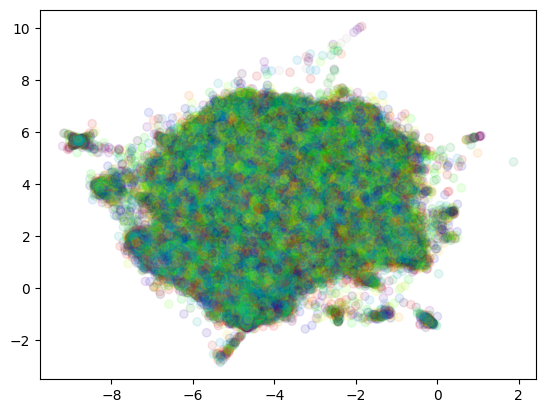

In [38]:
plt.scatter(*out.T,c=sdata.gene_ids,cmap='nipy_spectral',alpha=0.1)

In [18]:
plt.figure(figsize=(15,15))
sdata.bg.imshow()

AttributeError: 'SpatialData' object has no attribute 'bg'

<Figure size 1500x1500 with 0 Axes>

In [17]:
sdata_downsampled.graph.umap_js()

    'data': [{'hoverinfo': 'none',
              'marker': {'colo…

In [12]:
sdata.save('de-noise.pl')

In [13]:
sdata = pl.load('de-noise.pl')



Index(['g', 'x', 'y', 'gene_id', 'noise', 'artefact'], dtype='object')


(<matplotlib.collections.PathCollection at 0x7f34e15e0580>, None, None)

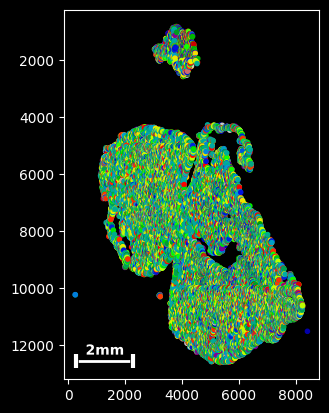

In [16]:
sdata[~sdata.noise].scatter()

In [35]:
sdata=sdata[~above_cutoff[sdata.gene_ids]]

In [37]:
import time

knn_neighbors=100
bandwidth=30
n_neighbors=30
metric='euclidean'
min_dist=0.05
random_state=42
zero_weight=0
cutoff=10

_=sdata.graph.update_knn(n_neighbors=knn_neighbors)


t = time.perf_counter()
sdata.graph.run_umap(bandwidth=bandwidth,n_neighbors=n_neighbors, 
                     min_dist=min_dist, metric=metric, 
                     random_state=random_state,zero_weight=zero_weight,
                    cutoff=cutoff)
print(time.perf_counter()-t)



Reducing dimensions with FastICA


/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:488: FutureWarning: From version 1.3 whiten='unit-variance' will be used by default.
  warnings.warn(


Calculating UMAP embedding.
442.49326622101944


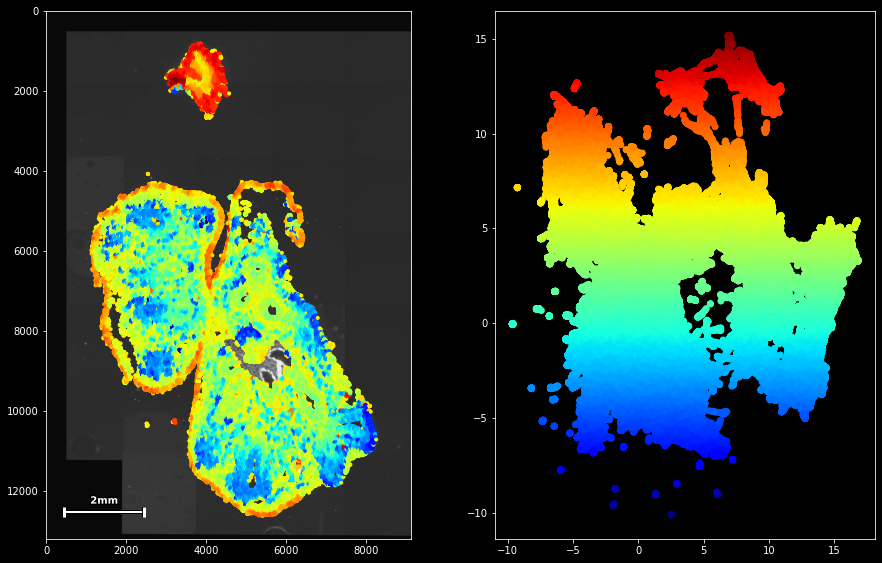

In [39]:
sdata.graph.map_and_umap(c=sdata.graph.umap_1)

In [40]:
sdata.graph.umap_js()

    'data': [{'hoverinfo': 'none',
              'marker': {'colo…

In [4]:
sdata=pl.load('de-noise.pl')

Index(['g', 'x', 'y', 'gene_id', 'noise', 'artefact', 'epithelial', 'bronchii',
       'epithelial-bronchii', 'matrix', 'islet'],
      dtype='object')


In [31]:
import squidpy as sq

sq.gr.spatial_neighbors(sdata,'spatial',radius=(100,120))

In [38]:
sq.gr.centrality_scores(sdata,'sections')

KeyboardInterrupt: 

In [300]:
labels

array([2, 0, 2, ..., 3, 5, 5])

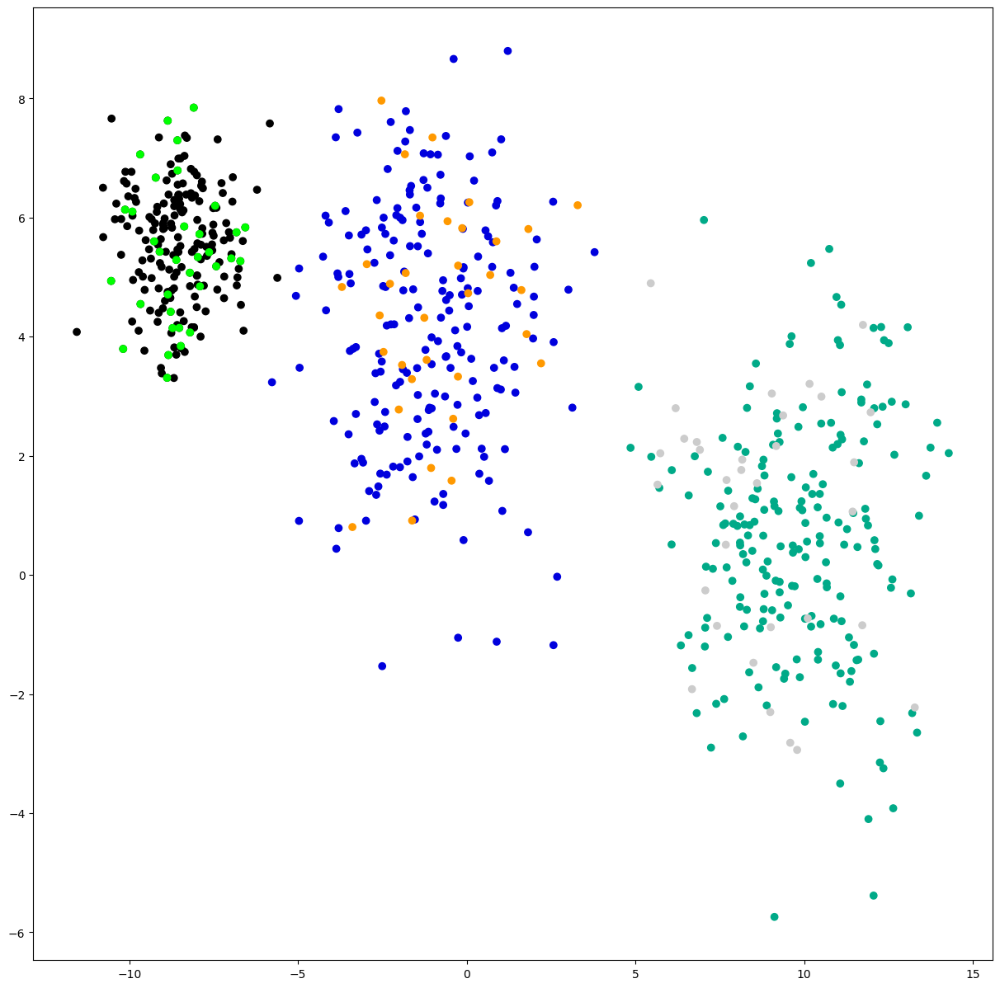

In [496]:
from sklearn.datasets import make_blobs,make_classification

rs=7

blobs = make_blobs(n_samples=600,centers=3,cluster_std=[1,2,2],random_state=rs,)

blobs_ = make_blobs(n_samples=100,centers=3,cluster_std=[1,2,2],random_state=rs,)

coords = np.concatenate((blobs[0],blobs_[0]))
labels = np.concatenate((blobs[1],blobs_[1]+3))

plt.scatter(*coords.T,c=labels,cmap='nipy_spectral')

In [497]:
sdata_ = pl.SpatialData(genes=labels.astype(str),
                        x_coordinates=coords[:,0],
                        y_coordinates=coords[:,1])

sdata_.graph.update_knn(n_neighbors=20)
models = sdata_.graph._determine_counts(bandwidth=0.5,regularization=0)

In [498]:
import umap
graph, sigmas, rhos = umap.umap_.fuzzy_simplicial_set(sdata_.coordinates,10,42,
                                                      'euclidean',local_connectivity=2,
                                                     angular=True)

In [499]:
graph.sum()

3154.7905

In [500]:

# for i,g in enumerate(sdata_.genes):
#     models[:,i]=np.array(graph[sdata_.g==g].sum(0)).flatten()

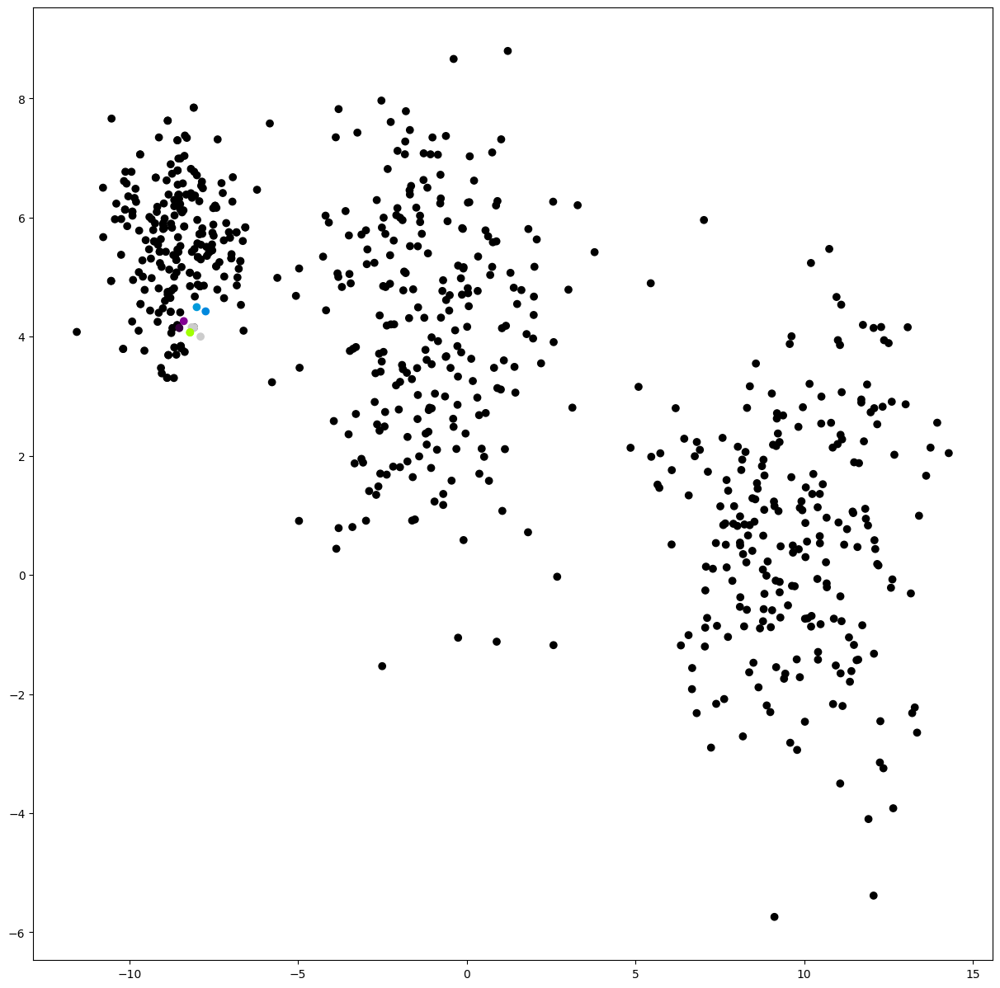

In [501]:
plt.scatter(*coords.T,c=graph[:,0].toarray(),cmap='nipy_spectral')
# plt.scatter

In [502]:
from sklearn.decomposition import PCA

pca=PCA(n_components=6)

H_sp = np.zeros((len(sdata_.genes),))
models_agg = np.zeros((len(sdata_.genes),)*2)

for i,g in enumerate(sdata_.genes):
#     if sdata_.counts[g]>3:    
    facs = pca.fit_transform(models[sdata_.g==g])
    models_agg[i]=models[sdata_.g==g].mean(0)
    p_ev = pca.explained_variance_ratio_
    H_evp = np.nan_to_num(-np.log2(p_ev)*p_ev).sum()
    H_sp[i]=H_evp
#     else:
#         H_sp[i]=10
#     break
H_sp = pd.Series(H_sp,index=sdata_.genes)

/tmp/ipykernel_16644/477726896.py:13: RuntimeWarning: divide by zero encountered in log2
  H_evp = np.nan_to_num(-np.log2(p_ev)*p_ev).sum()
/tmp/ipykernel_16644/477726896.py:13: RuntimeWarning: invalid value encountered in multiply
  H_evp = np.nan_to_num(-np.log2(p_ev)*p_ev).sum()
/tmp/ipykernel_16644/477726896.py:13: RuntimeWarning: divide by zero encountered in log2
  H_evp = np.nan_to_num(-np.log2(p_ev)*p_ev).sum()
/tmp/ipykernel_16644/477726896.py:13: RuntimeWarning: invalid value encountered in multiply
  H_evp = np.nan_to_num(-np.log2(p_ev)*p_ev).sum()
/tmp/ipykernel_16644/477726896.py:13: RuntimeWarning: divide by zero encountered in log2
  H_evp = np.nan_to_num(-np.log2(p_ev)*p_ev).sum()
/tmp/ipykernel_16644/477726896.py:13: RuntimeWarning: invalid value encountered in multiply
  H_evp = np.nan_to_num(-np.log2(p_ev)*p_ev).sum()
/tmp/ipykernel_16644/477726896.py:13: RuntimeWarning: divide by zero encountered in log2
  H_evp = np.nan_to_num(-np.log2(p_ev)*p_ev).sum()
/tmp/ipyker

In [503]:
models.sum()

5944.108319459166

(<matplotlib.collections.PathCollection at 0x7f3dc97921c0>, None, None)

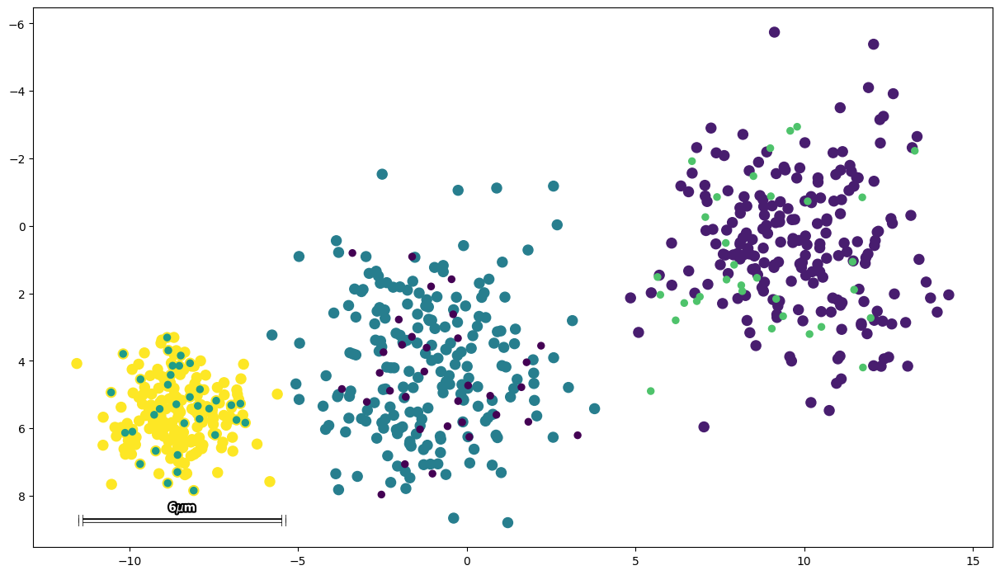

In [504]:
# plt.imshow(facs,aspect='auto')
sdata_.scatter(c=H_sp.values[sdata_.gene_ids],s=sdata_.counts[sdata_.gene_ids]+100,cmap='viridis',marker='.')


In [494]:
sdata_.counts[H_sp.sort_values().index]

5    16
4    17
2    66
3    17
1    67
0    67
Name: counts, dtype: int64

(<matplotlib.collections.PathCollection at 0x7f3db57ba910>, None, None)

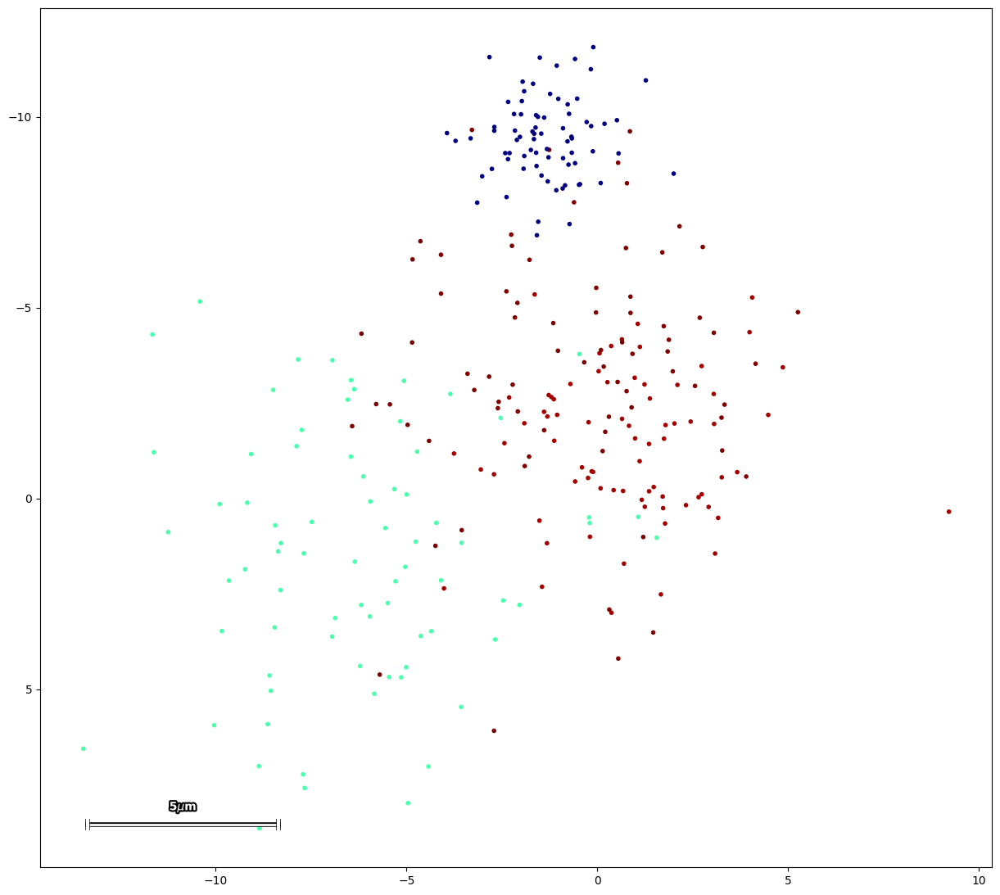

In [192]:
sdata_.scatter(c=H_sp.values[sdata_.gene_ids])

In [150]:
plt.figure(figsize=(25,5))
# H_sp.sort_values()[:-1].plot.bar()
sdata.counts[H_sp.sort_values()[:-1].index].plot.bar()

KeyError: "None of [CategoricalIndex(['2', '3', '0'], categories=['0', '1', '2', '3'], ordered=False, dtype='category')] are in the [index]"

<Figure size 2500x500 with 0 Axes>

In [204]:
# sdata.stats.loc['SFRP2','gene_ids']
figure()

# sdata[sdata.gene_ids.isin(np.argsort(models[113])[:5])].scatter(legend='True')

<Figure size 1080x1080 with 0 Axes>

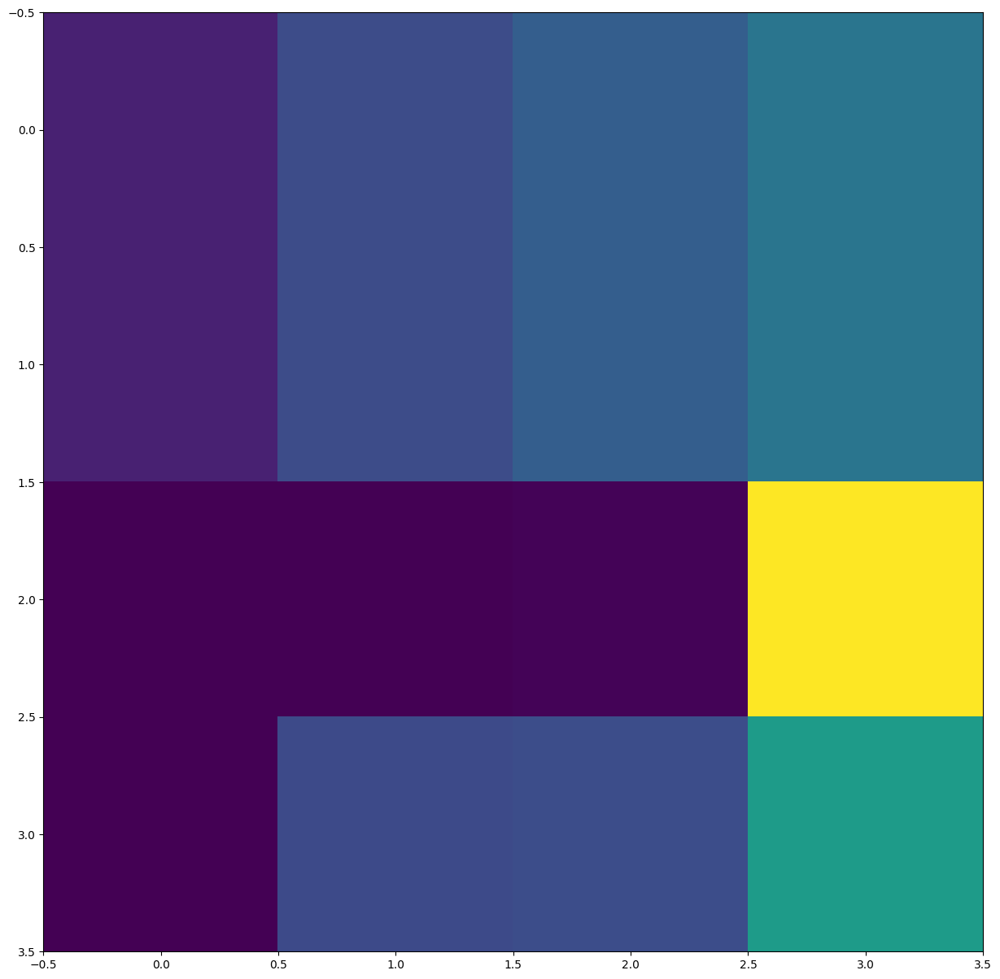

In [151]:
plt.figure(figsize=(15,15))
# models_ = models/models.sum(0)
models_agg_=(models_agg.T/models_agg.sum(1)).T
plt.imshow(np.sort(models_agg_[np.argsort(H_sp)],axis=1))

In [ ]:
models=sdata.graph

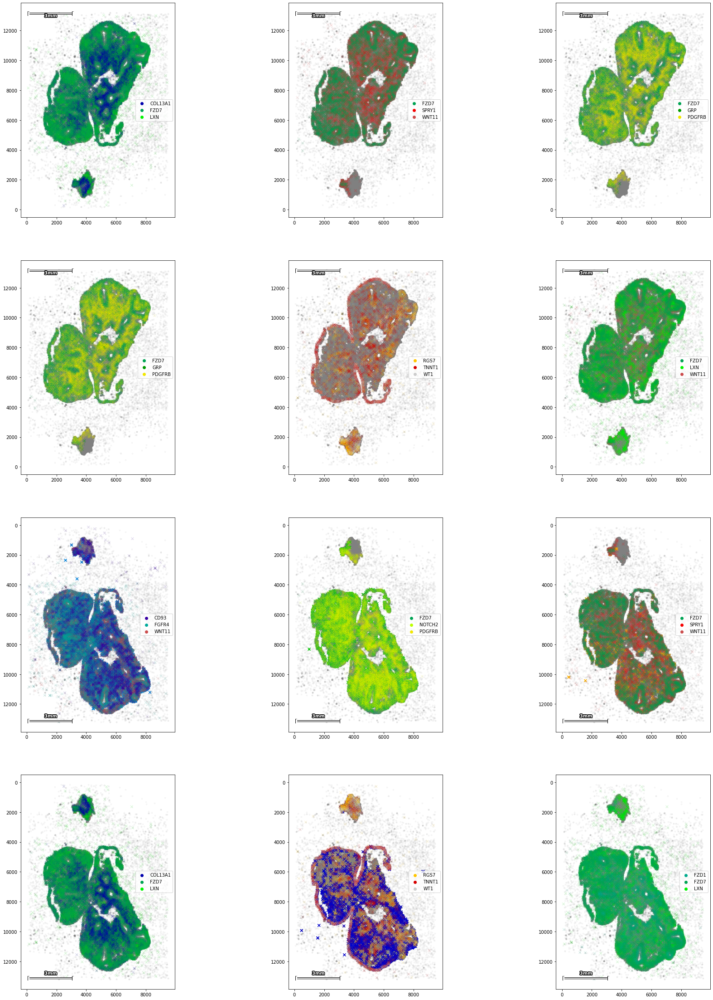

In [170]:
plt.figure(figsize=(30,40))

for i,g in enumerate(H_sp.sort_values().index[:6]):

    plt.subplot(4,3,i+1)
    sdata.scatter(color=[0.5,0.5,0.5,0.05])
#     sdata[sdata.g==g].scatter(marker='x',scalebar=False)

    sdata[sdata.gene_ids.isin(np.argsort(models[sdata.stats.loc[g,'gene_ids']])[-3:])].scatter(legend='True',scalebar=False,alpha=0.1,marker='x')

for i,g in enumerate(H_sp.sort_values().index[-6:]):

    plt.subplot(4,3,i+7)
    sdata.scatter(color=[0.5,0.5,0.5,0.05])
    sdata[sdata.g==g].scatter(marker='x',scalebar=False)
    sdata[sdata.gene_ids.isin(np.argsort(models[sdata.stats.loc[g,'gene_ids']])[-3:])].scatter(legend='True',scalebar=False,alpha=0.1,marker='x')


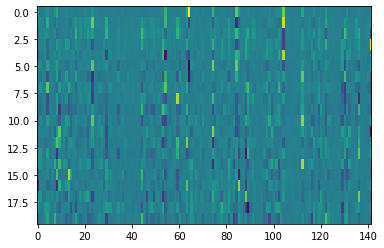

In [31]:
plt.imshow(pca.components_,aspect='auto',interpolation='none')

In [86]:
pair_counts = np.zeros([len(sdata.genes)]*2)

pair_counts[sdata.graph.neighbor_types[:,0],sdata.graph.neighbor_types[:,1]]+=1

In [97]:
for i in range(10):
    unqs,counts = np.unique([sdata.graph.neighbor_types[:,0],sdata.graph.neighbor_types[:,i+1]],axis=1,return_counts=True)
    pair_counts[unqs[0],unqs[1]]+=counts

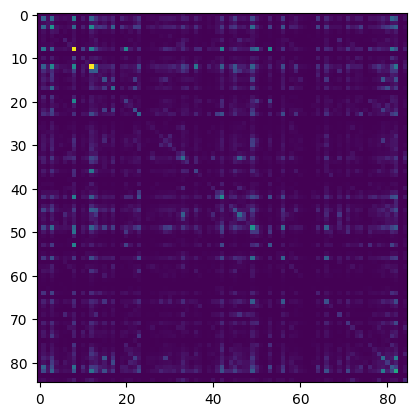

In [98]:
plt.imshow(pair_counts)


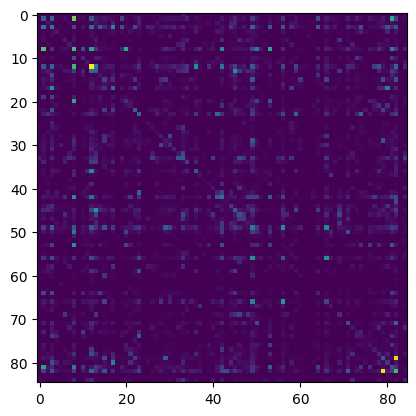

In [95]:
plt.imshow(pair_counts)

In [14]:
sdata

,g,x,y,gene_id,noise,epithelium,bronchii,bronchii-epithelial
0,FLT1,1190.493724,4909.911982,47,True,False,False,False
1,FLT1,1194.492023,4908.912407,47,True,False,False,False
2,JAG2,1614.313488,4852.936212,69,True,False,False,False
3,RSPO2,1634.304986,4940.898805,107,False,False,False,False
4,SPRY1,1759.251850,4982.880951,120,False,True,False,False
...,...,...,...,...,...,...,...,...
494144,MET,9209.083692,11432.138303,81,True,False,False,False
494145,FGFR4,9292.048410,10289.624175,46,True,False,False,False
494146,FGFR4,9343.026730,11295.196539,46,True,False,False,False
494147,DTX1,9475.970194,13125.418209,25,True,False,False,False


In [15]:
sdata['sections']=sdata.unite_columns(['epithelium',  'bronchii',  'bronchii-epithelial',   'noise'])

(<matplotlib.collections.PathCollection at 0x7f4b818164f0>, None, None)

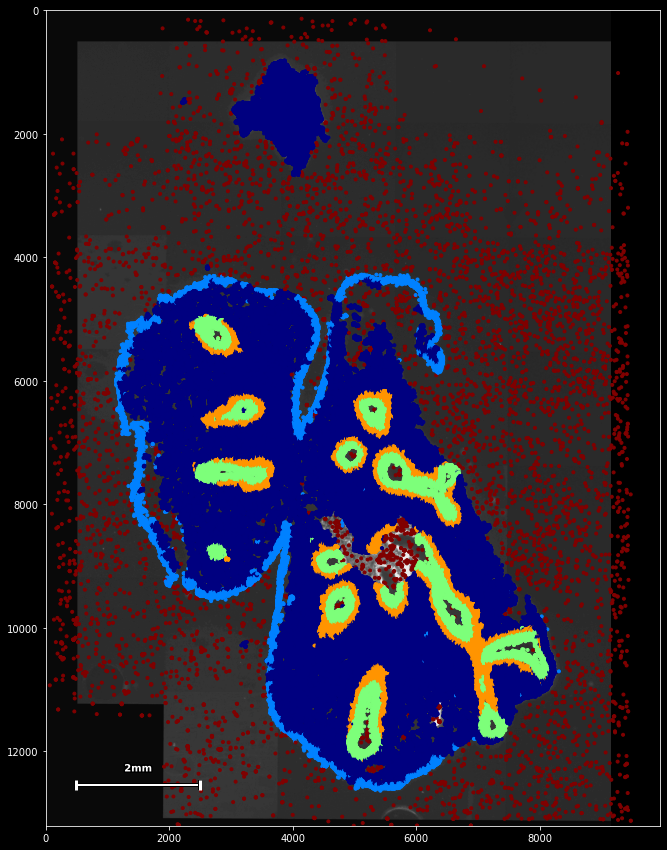

In [18]:
plt.figure(figsize=(15,15))
sdata.scatter(c=sdata.sections.cat.codes)

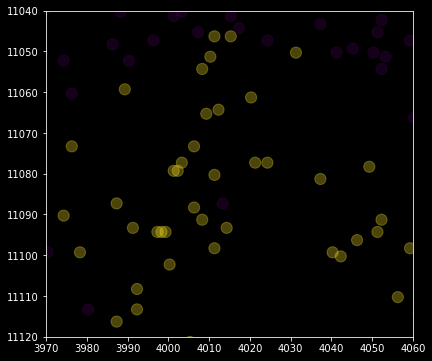

In [8]:
import umap

plt.figure(figsize=(28,6))

cons = [40]

for i,con in enumerate(cons):
    graph, sigmas, rhos = umap.umap_.fuzzy_simplicial_set(sdata.coordinates,180,42,
                                                          'euclidean',local_connectivity=con,
                                                         angular=True)
    
    plt.subplot(1,len(cons)+1,i+1)
    plt.style.use('dark_background')
    sdata.scatter(c=(graph[20000].toarray()).flatten(),alpha=0.3,cmap='viridis',s=500,scalebar=False)

    plt.xlim(3970,4060)
    plt.ylim(11120,11040)
    break

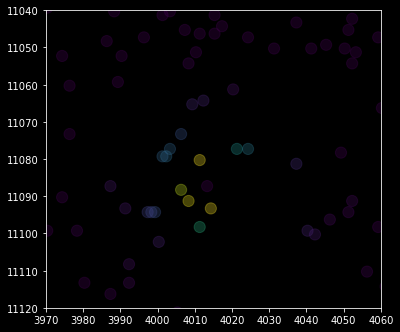

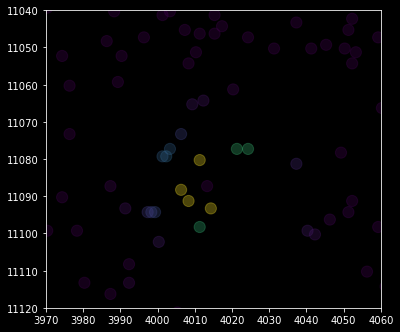

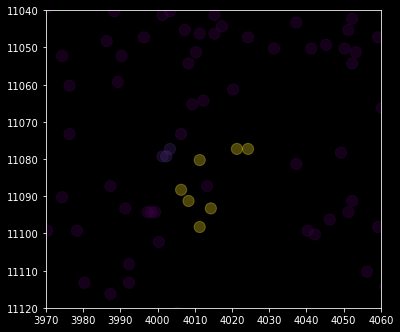

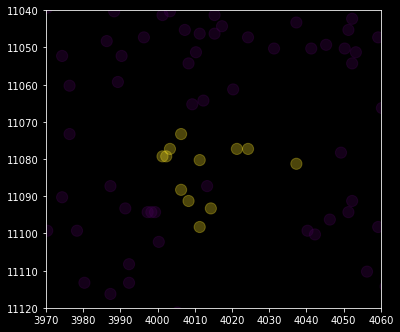

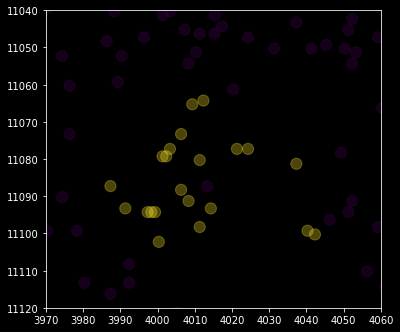

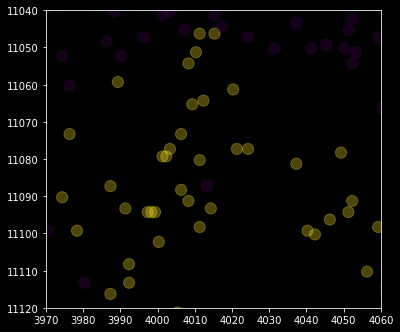

In [12]:
import umap


cons = [1,2,5,10,20,40]

for i,con in enumerate(cons):
    graph, sigmas, rhos = umap.umap_.fuzzy_simplicial_set(sdata.coordinates,40,42,'euclidean',local_connectivity=con)
    
    plt.figure(figsize=(6,6))
    plt.style.use('dark_background')
    sdata.scatter(c=(graph[20000].toarray()).flatten(),alpha=0.3,cmap='viridis',s=500,scalebar=False)

    plt.xlim(3970,4060)
    plt.ylim(11120,11040)
    

<IPython.core.display.Javascript object>


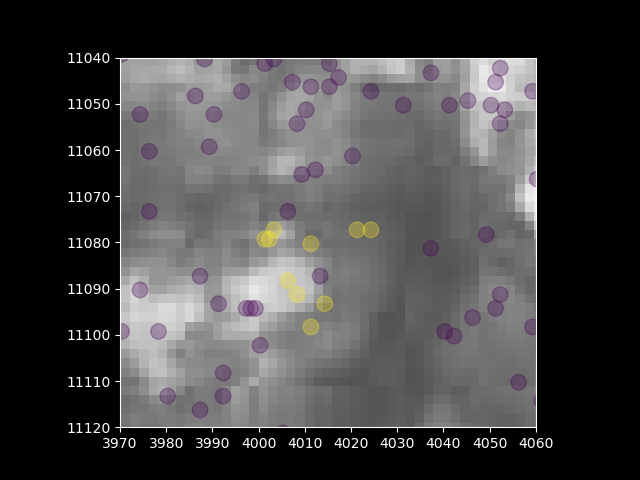

(11120.0, 11040.0)

In [38]:
%matplotlib notebook

plt.style.use('dark_background')
sdata.scatter(c=(graph[20000].toarray()).flatten(),alpha=0.3,cmap='viridis',s=500)
# sdata[20000:20001].scatter(s=500)

plt.xlim(3970,4060)
plt.ylim(11120,11040)

In [173]:
idcs = sdata.gene_ids[graph[20000].toarray().flatten()>0].values

In [184]:
sorted(idcs)

[1,
 1,
 2,
 3,
 3,
 3,
 4,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 10,
 10,
 16,
 20,
 22,
 23,
 23,
 23,
 23,
 23,
 23,
 23,
 23,
 23,
 25,
 28,
 29,
 29,
 29,
 29,
 30,
 30,
 31,
 31,
 31,
 31,
 34,
 37,
 41,
 41,
 42,
 42,
 42,
 42,
 42,
 42,
 42,
 42,
 42,
 42,
 45,
 45,
 45,
 45,
 48,
 49,
 49,
 49,
 50,
 50,
 50,
 50,
 53,
 53,
 55,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 56,
 65,
 66,
 66,
 69,
 70,
 70,
 71,
 71,
 73,
 73,
 73,
 74,
 74,
 74,
 74,
 76,
 76,
 76,
 78,
 78,
 81,
 81,
 81,
 82,
 82,
 82,
 82]

In [9]:
import tqdm

out = np.zeros((len(sdata),len(sdata.stats,)))

for i in tqdm.tqdm_notebook(range(graph.shape[0])):
    arr=graph[i].toarray().flatten()
    vals = arr[arr>0]
    idcs=np.where(arr>0)[0]
    
    genes=sdata.gene_ids[arr>0].values
    
    for j,idx in enumerate(idcs):
        out[i,genes[j]]+=vals[j]

/tmp/ipykernel_431093/2413023141.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm.tqdm_notebook(range(graph.shape[0])):


  0%|          | 0/197346 [00:00<?, ?it/s]

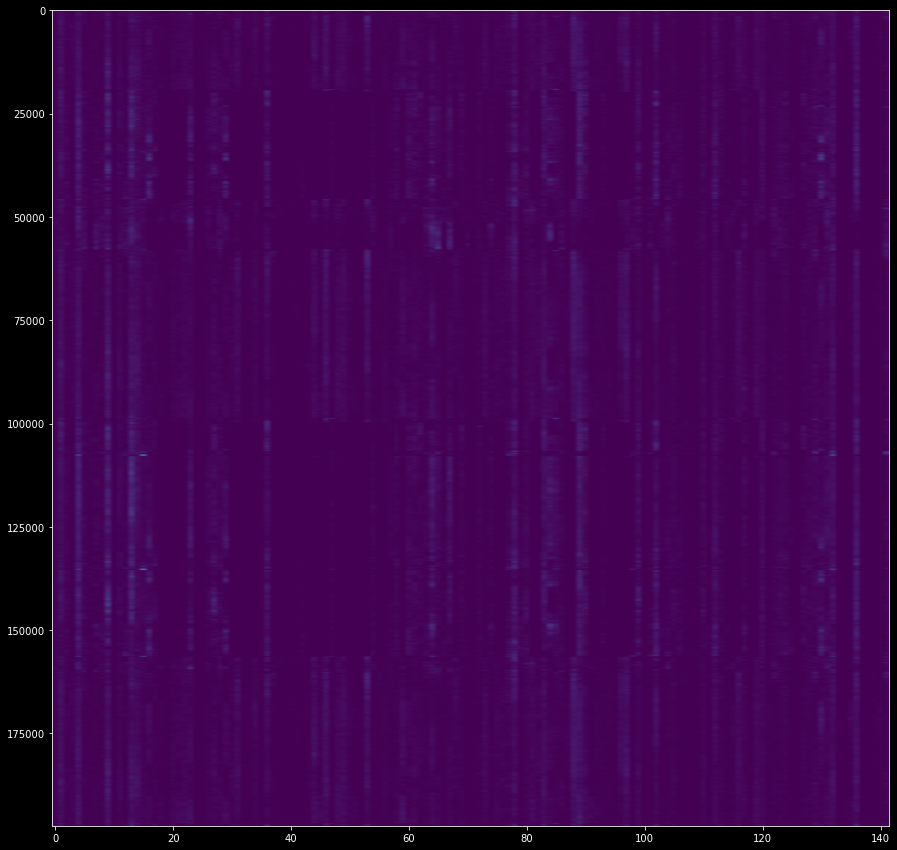

In [10]:
plt.figure()
plt.imshow(out,aspect='auto')

In [11]:
import umap

umap = umap.UMAP(n_neighbors=70,)

coords = umap.fit_transform(out)

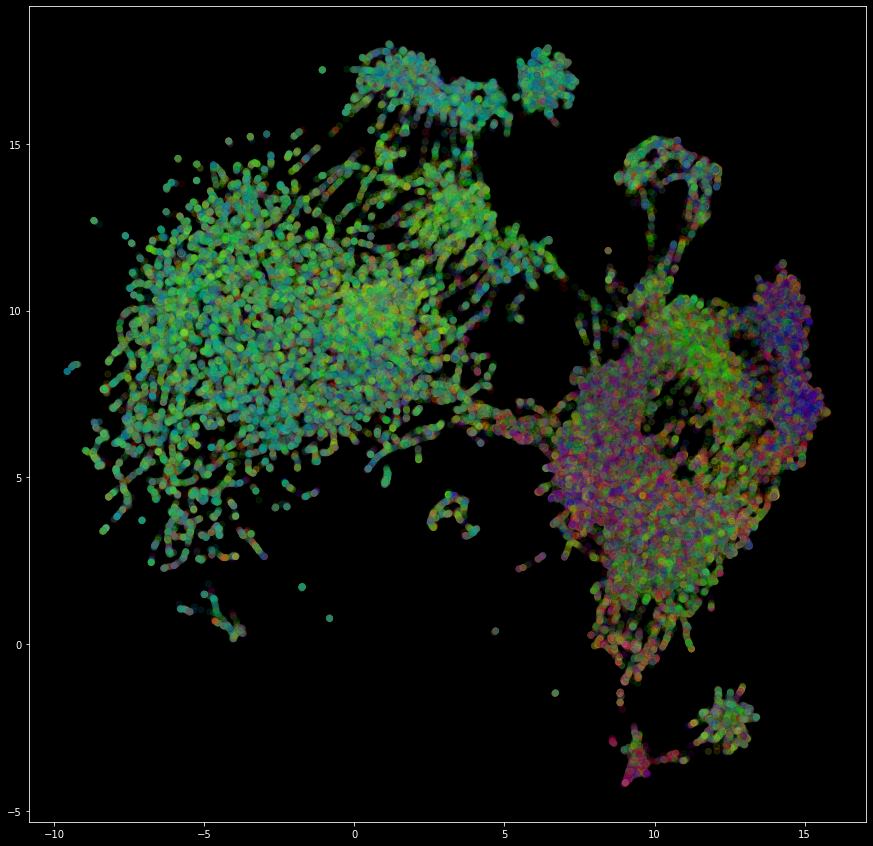

In [12]:
plt.figure()
plt.scatter(*coords.T,c=sdata.gene_ids,cmap='nipy_spectral',alpha=0.1)

In [18]:
sdata.graph._umap = coords

sdata.graph.umap_js()

    'data': [{'hoverinfo': 'none',
              'marker': {'colo…

In [44]:
idcs,counts = np.unique(np.argmax(out,axis=1),return_counts=True)

In [45]:
idcs[np.argmax(counts)]

112

In [19]:
from sklearn.decomposition import FastICA

ica = FastICA(n_components=3)
facs = ica.fit_transform(out)

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:488: FutureWarning:

From version 1.3 whiten='unit-variance' will be used by default.



<IPython.core.display.Javascript object>


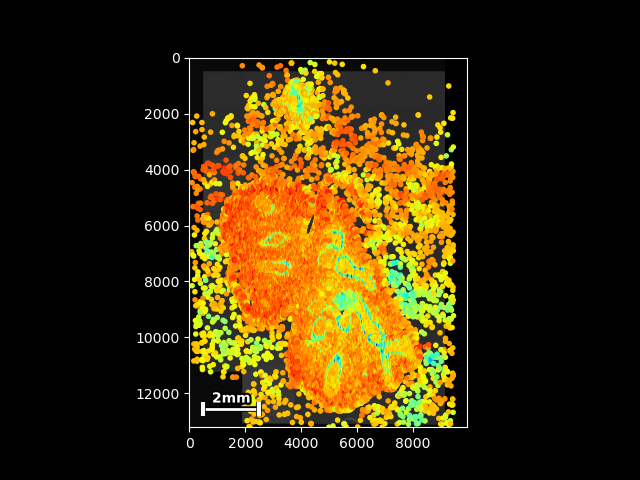

(<matplotlib.collections.PathCollection at 0x7fc02fb91730>, None, None)

In [20]:
plt.figure()
sdata.scatter(c=facs[:,0])

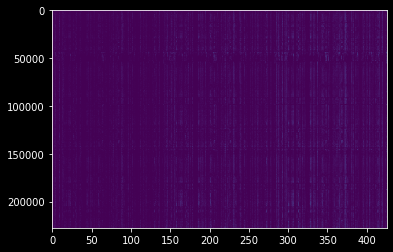

In [60]:
plt.imshow(np.concatenate([models,models1,models2],axis=1)**0.9,aspect='auto')

In [24]:
sdata.graph.update_knn(n_neighbors=120)
models = sdata.graph._determine_counts(bandwidth=2)/2
models1 = sdata.graph._determine_counts(bandwidth=8)/8
models2 = sdata.graph._determine_counts(bandwidth=24)/24

In [62]:
from sklearn.decomposition import FastICA

ica = FastICA(n_components=30)
facs = ica.fit_transform(np.concatenate([models,models1,models2],axis=1))

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:488: FutureWarning:

From version 1.3 whiten='unit-variance' will be used by default.



In [27]:
from sklearn.decomposition import FastICA
from umap import UMAP

ica = FastICA(n_components=40)
facs = ica.fit_transform(np.concatenate([models,models1,models2],axis=1))

umap = UMAP(n_neighbors=10,min_dist=0.0,n_components=3)
out_ = umap.fit_transform(facs)

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:488: FutureWarning: From version 1.3 whiten='unit-variance' will be used by default.
  warnings.warn(


In [28]:
facs.shape

from umap import UMAP

ica = FastICA(n_components=10)
facs = ica.fit_transform(np.concatenate([models,models1,models2],axis=1))

umap = UMAP(n_neighbors=30,min_dist=0.05,n_components=2)
out = umap.fit_transform(facs)

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:488: FutureWarning: From version 1.3 whiten='unit-variance' will be used by default.
  warnings.warn(


In [29]:
sdata.graph._umap = out

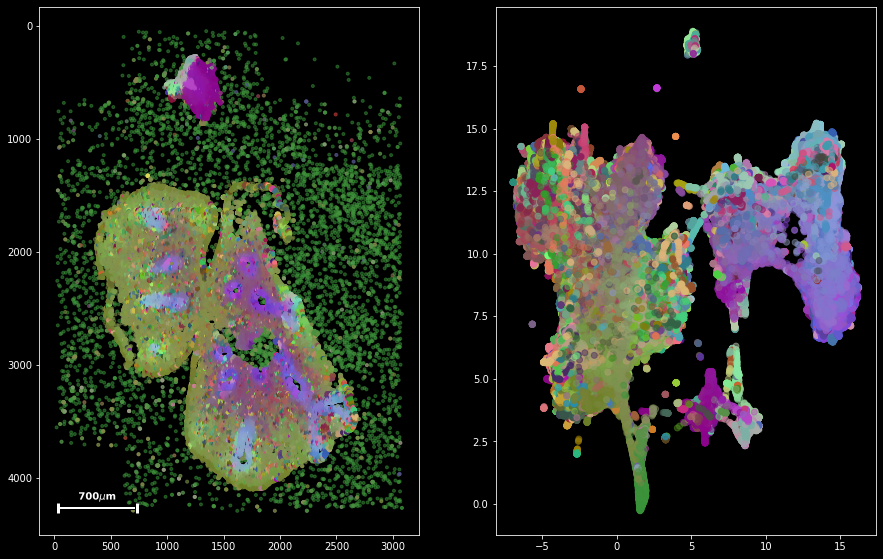

In [30]:
out_-=out_.min(0)-0.1
out_/=out_.max(0)

figure(15,15)
sdata.graph.map_and_umap(c=out_,alpha=0.5)

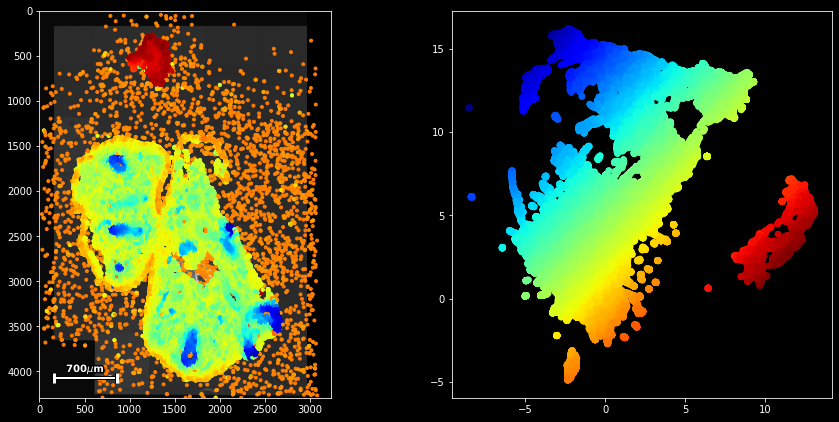

In [65]:
figure(15,11)
sdata.graph.map_and_umap(c=sdata.graph.umap_0-sdata.graph.umap_1)

In [66]:
sdata.graph.umap_js()

    'data': [{'hoverinfo': 'none',
              'marker': {'colo…

(<matplotlib.collections.PathCollection at 0x7febea837c70>, None, None)

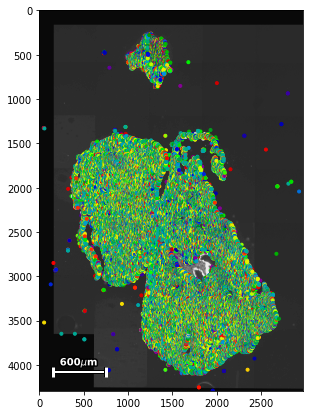

In [41]:
figure(5,7)

sdata[~sdata.bg_noise].scatter()

# Supervised analysis:

In [8]:
# 'cheat-create' an anndata set:

pci = pd.read_csv('/home/sebastian/Downloads/S2T1_pcw6_complex_celltypes_formatted.csv',index_col=0)
import anndata

cts = pci['cell type'].unique()
cts = [c[:-1] if c[-1]==' ' else c for c in cts]
cts = sorted(pd.Series([c[:-2] if c[-1].isdigit() else c for c in cts]).unique())
# cts

signatures = pd.DataFrame(columns=cts,index=pci.columns[78:])


for c in cts:
    kewl = pci[pci['cell type'].str.contains(c)]
    signatures[c] = kewl.iloc[:,78:].mean(0)
    

adata = anndata.AnnData(signatures.T)
adata.X = np.array(np.nan_to_num(signatures.T))
adata.obs['celltype'] = adata.obs.index

pl.ScanpyDataFrame(sdata,adata)

/tmp/ipykernel_239791/3053895953.py:19: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = anndata.AnnData(signatures.T)


In [14]:
sdata = pl.SpatialData(
                        coordinates.Gene,
                        coordinates.Global_x_pos*um_p_px,
                        coordinates.Global_y_pos*um_p_px,
#                         pixel_maps={'DAPI':bg_map},
                        scanpy=adata
                        )

sdata = sdata.clean()

In [15]:
signatures = sdata.scanpy.generate_signatures()

signatures[signatures.isna()]=0

signatures

/home/sebastian/src/planktonpy/plankton/plankton.py:101: RuntimeWarning: invalid value encountered in true_divide
  self.signature_matrix = self.signature_matrix / self.signature_matrix.std(


,ARIH1,ATP11A,BCL2,BMP5,CCBE1,CCL21,CD36,CD74,CD93,CDON,...,UPK3B,VEGFC,VEGFD,WIF1,WNT11,WNT2,WNT2B,WNT5A,WNT7B,WT1
Adventitial fibroblast,2.675679,-0.127429,-0.219334,-0.219334,0.791623,-0.632907,-0.403144,-0.586955,1.021386,-0.678860,...,0.148287,-0.632907,-0.632907,-0.495050,5.892360,-0.632907,-0.678860,-0.541002,-0.678860,0.194239
Aimmature ASM,0.785320,-0.311018,0.560430,0.869654,-0.029906,-0.535908,-0.170462,-0.311018,0.335541,-0.620242,...,0.335541,-0.592130,-0.620242,-0.451574,7.026015,-0.592130,-0.620242,-0.311018,-0.564019,-0.254795
Airway fibroblast,1.267024,-0.211620,-0.016188,2.889475,-0.178433,-0.300117,-0.388614,-0.392302,1.303897,-0.473424,...,0.212430,-0.440238,-0.473424,-0.355428,0.953595,-0.458675,-0.473424,-0.348053,-0.473424,-0.292742
Airway smooth muscle (ASM),0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Arterial,1.140750,-0.508181,-0.395754,0.541138,-0.583133,-0.470705,-0.545657,-0.583133,6.537251,-0.695560,...,0.728517,-0.695560,-0.545657,-0.583133,0.653566,-0.695560,-0.695560,-0.620608,-0.695560,-0.283327
B-cell,-0.455779,-0.455779,-0.455779,1.511513,0.855749,-0.455779,0.199985,0.199985,0.199985,-0.455779,...,0.199985,-0.455779,0.199985,0.199985,-0.455779,-0.455779,-0.455779,-0.455779,-0.455779,1.511513
Bronchial endothelial,1.868349,-0.210379,-0.231166,1.411029,-0.355890,-0.439039,-0.480614,-0.459826,7.293830,-0.605337,...,1.639689,-0.605337,-0.584550,-0.314316,1.244731,-0.584550,-0.626125,-0.542976,-0.605337,-0.314316
CTGFhigh distal epithelial,0.677575,0.677575,-0.083685,0.373071,-0.692693,-0.616567,-0.692693,0.449197,-0.083685,-0.768819,...,0.982079,-0.692693,-0.768819,1.362710,2.428474,-0.768819,-0.844945,-0.692693,0.296945,-0.692693
Capillary,0.205469,-0.087169,-0.331033,0.059150,-0.331033,-0.331033,-0.331033,-0.379806,7.228771,-0.379806,...,0.595652,-0.331033,-0.331033,-0.282260,0.303015,-0.379806,-0.379806,-0.331033,-0.331033,-0.184714
Chondroblast,2.059299,-0.081509,-0.194183,1.383254,-0.278689,-0.306857,-0.081509,-0.363194,1.524097,-0.532205,...,1.580434,-0.532205,-0.560374,-0.335026,1.355086,-0.504037,-0.560374,-0.447700,-0.560374,-0.391363


In [72]:
from scipy.ndimage import gaussian_filter, maximum_filter


n_bins = np.array(sdata.spatial.shape)

vf = (gaussian_filter(np.histogram2d(*sdata.coordinates.T,bins=n_bins)[0],2))

In [115]:
plt.figure(figsize=(15,15))
localmaxs=np.where((maximum_filter(vf,3)==vf)&(vf>0.2))

<Figure size 1080x1080 with 0 Axes>

In [120]:
from sklearn.neighbors import NearestNeighbors

knn = NearestNeighbors(n_neighbors=150)
knn.fit(sdata.coordinates)
dists,nbrs=knn.kneighbors(np.array(localmaxs).T)
neighbor_types = np.array(sdata.gene_ids)[nbrs]

In [124]:
counts = np.zeros((dists.shape[0], len(sdata.genes)))

# if kernel is None:
bandwidth=2
def kernel(x): return np.exp(-x**2/(2*bandwidth**2))

for i in range(0, dists.shape[1]):
    counts[np.arange(dists.shape[0]), neighbor_types[:, i]
           ] += kernel(dists[:, i])

assert (all(counts.sum(1)) > 0)
# counts[np.arange(len(sdata)),
#        self.sdata.gene_ids] += regularization-1

# return counts

In [ ]:


ig.Graph.TupleList(counts)

In [147]:
import igraph as ig
import leidenalg


# leidenalg.find_partition(counts,partition_type=)

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:488: FutureWarning: From version 1.3 whiten='unit-variance' will be used by default.
  warnings.warn(


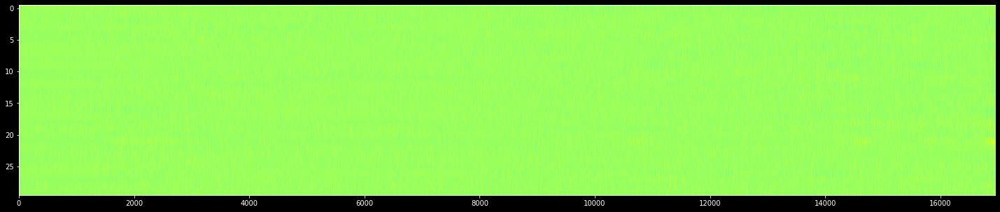

In [161]:
from sklearn.decomposition import FastICA

ica = FastICA(n_components=30)
facs = ica.fit_transform(counts)

figure(25,5)
plt.imshow(facs.T,aspect='auto',cmap='jet')

In [243]:
counts/=counts.sum(1).shape

In [271]:
from sklearn.cluster import KMeans, AgglomerativeClustering

# km = KMeans(
#         n_clusters=20,
#         max_iter=100,
#         n_init=1,)

ac = AgglomerativeClustering(n_clusters=8,affinity='euclidean')
classes = ac.fit_predict(counts[:])
# classes = km.fit_predict(counts[:])

# opt =  OPTICS()

# classes = opt.fit_predict(km.cluster_centers_)

In [275]:
ac.

{'affinity': 'euclidean',
 'compute_distances': False,
 'compute_full_tree': 'auto',
 'connectivity': None,
 'distance_threshold': None,
 'linkage': 'ward',
 'memory': None,
 'n_clusters': 8}

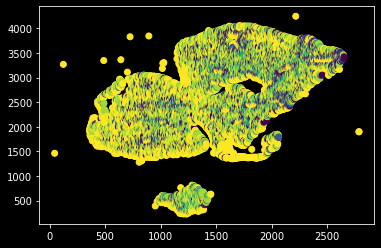

In [274]:
plt.scatter(localmaxs[0], localmaxs[1], c=classes)

In [215]:
from sklearn.decomposition import PCA

pca=PCA(n_components=counts.shape[1])
facs = pca.fit_transform(counts.T)

In [261]:
signatures.shape

(2000,)

In [276]:
from plankton.utils import localmax_sampling

signatures = localmax_sampling(sdata,n_clusters=10,bandwidth=4)

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/sklearn/decomposition/_fastica.py:488: FutureWarning: From version 1.3 whiten='unit-variance' will be used by default.
  warnings.warn(


In [263]:
from plankton.utils import ssam

ctmap = ssam(sdata,signatures=signatures,kernel_bandwidth=4,patch_length=2000,threshold_cor=0.2,threshold_exp=0.1)

[21, 2021, 3081] [43, 2043, 4043, 4292]


  0%|          | 0/6 [00:00<?, ?it/s]

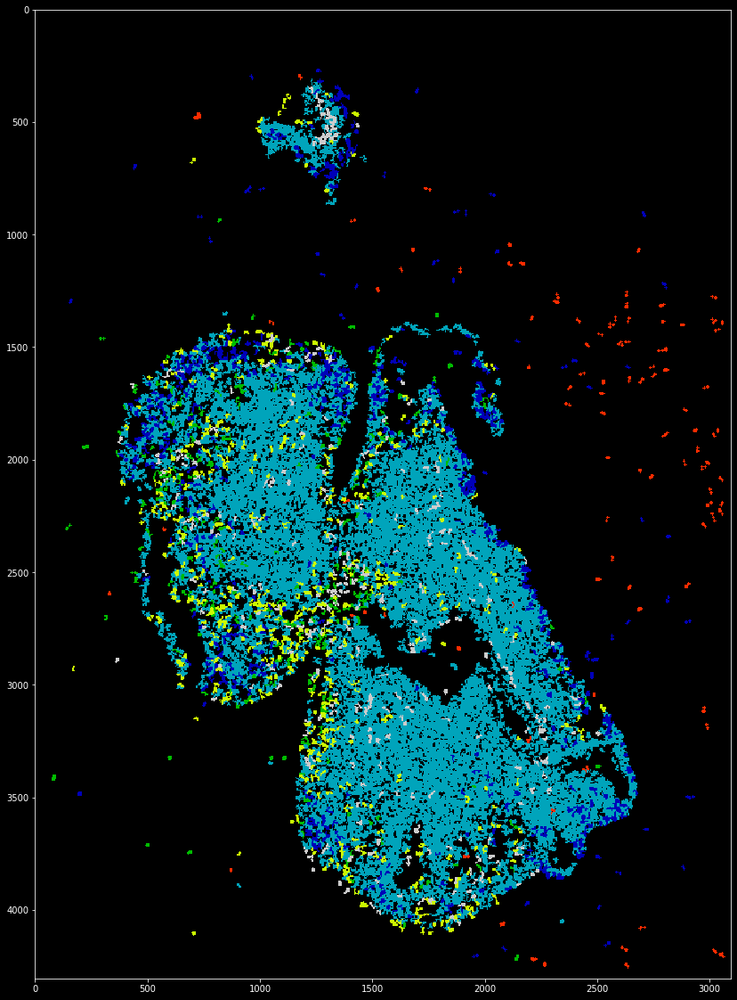

In [277]:
figure(15,20)
ctmap.imshow(cmap='nipy_spectral',interpolation='none')

[319 319 315 ... 734 853 853]


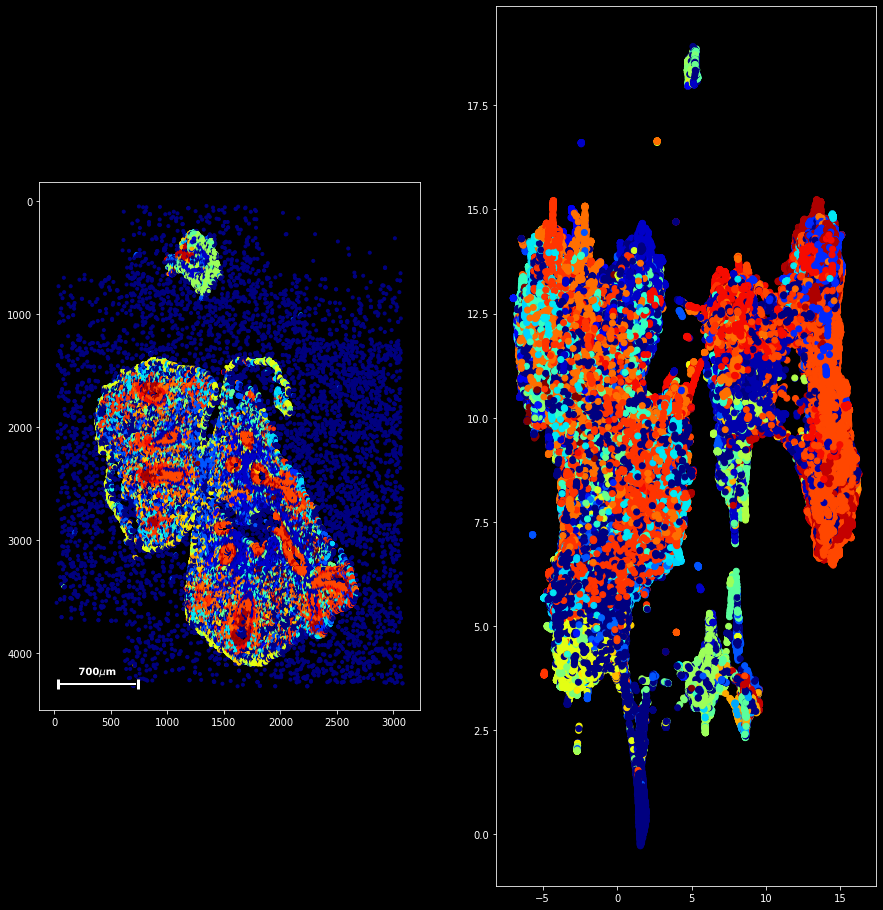

In [31]:
figure(15,25)
ct = ctmap.get_value(sdata.x,sdata.y)

sdata.graph.map_and_umap(c=ct)
# ct

In [150]:
from urllib import request

# Define base URL path to the data
base_path = 'https://export.uppmax.uu.se/snic2022-23-113/courses/spatial_omics_2022/single_cell/'

# Download each dataset
for i in ['10X151w1','10X180w1','10x289w3','10x303w3']:
    tmp = 'Sountoulidis2022_'+i+'_counts.h5'
    request.urlretrieve( base_path+tmp , '/home/sebastian/data/spatial-workshop/single_cell/'+tmp )



In [3]:
import scanpy as sc
import anndata as an

import scanorama

In [164]:

# Define paths and get sample_ids
obj_list = list()
file_list = os.listdir('/home/sebastian/data/spatial-workshop/single_cell/')
sample_ids = [j.replace('_counts.h5','') for j in [x.replace('Sountoulidis2022_','') for x in file_list]]

# Read each table and append to our list
for i in range(0,len(file_list)):
    print(i)
    tmp = sc.read_10x_h5('/home/sebastian/data/spatial-workshop/single_cell/'+file_list[i])
    tmp.var_names_make_unique()
    tmp.obs['sample_id'] = sample_ids[i]
    obj_list.append(tmp)



0


/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/readwrite.py:272: FutureWarning:

X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.



1


/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/readwrite.py:272: FutureWarning:

X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.



2


/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/readwrite.py:272: FutureWarning:

X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.



3


/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/readwrite.py:272: FutureWarning:

X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.



In [166]:
import anndata as an



# Merge all samples into a single AnnData Object 
adata = an.concat( obj_list , merge='same' )
adata.var_names_make_unique()



In [167]:


# os.makedirs('/home/sebastian/data/spatial-workshop/single_cell/', exist_ok=True)
adata.write_h5ad('/home/sebastian/data/spatial-workshop/single_cell/scRNAseq.h5ad' )



In [168]:
# mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('MT-') 
# ribosomal genes
adata.var['ribo'] = adata.var_names.str.startswith(("RPS","RPL"))
# hemoglobin genes.
adata.var['hb'] = adata.var_names.str.contains(("^HB[^(P)]"))

adata.var


,gene_ids,feature_types,genome,mt,ribo,hb
FAM138A,FAM138A,Gene Expression,undefined,False,False,False
AL627309.1,AL627309.1,Gene Expression,undefined,False,False,False
AL627309.3,AL627309.3,Gene Expression,undefined,False,False,False
AL627309.2,AL627309.2,Gene Expression,undefined,False,False,False
OR4F29,OR4F29,Gene Expression,undefined,False,False,False
...,...,...,...,...,...,...
TTTY4B,TTTY4B,Gene Expression,undefined,False,False,False
BPY2B,BPY2B,Gene Expression,undefined,False,False,False
DAZ4,DAZ4,Gene Expression,undefined,False,False,False
CDY1,CDY1,Gene Expression,undefined,False,False,False


In [169]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)

In [170]:
mito_genes = adata.var_names.str.startswith('MT-')

# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata.obs['percent_mt2'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1

# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

adata

AnnData object with n_obs × n_vars = 25601 × 33538
    obs: 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

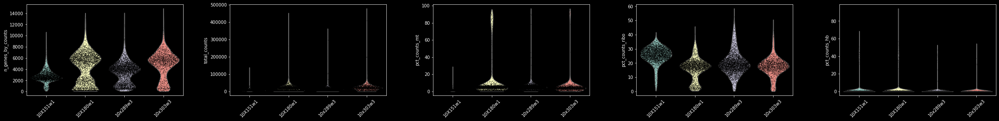

In [172]:
%matplotlib inline

plt.style.use('dark_background')
variables = ['n_genes_by_counts', 'total_counts', 
        'pct_counts_mt','pct_counts_ribo', 'pct_counts_hb']
sc.pl.violin(adata, variables, jitter=0.4, groupby = 'sample_id', rotation= 45)

In [173]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

print(adata.n_obs, adata.n_vars)


24875 28078


In [174]:


# save normalized counts in raw slot.
adata.raw = adata

# normalize to depth 10000 UMIs per cell
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# logaritmize
sc.pp.log1p(adata)



In [177]:
# Create folder
os.makedirs('/home/sebastian/data/spatial-workshop/single_cell/supplementary_files', exist_ok=True)

request.urlretrieve(
    url      = 'https://raw.githubusercontent.com/theislab/scanpy_usage/master/180209_cell_cycle/data/regev_lab_cell_cycle_genes.txt',
    filename = '/home/sebastian/data/spatial-workshop/single_cell/supplementary_files/regev_lab_cell_cycle_genes.txt' )

('/home/sebastian/data/spatial-workshop/single_cell/supplementary_files/regev_lab_cell_cycle_genes.txt',
 <http.client.HTTPMessage at 0x7fcca4135a00>)

In [181]:
# Load gene list from file
cell_cycle_genes = [x.strip() for x in open('/home/sebastian/data/spatial-workshop/single_cell/supplementary_files/regev_lab_cell_cycle_genes.txt')]

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

# Filter out genes not detectd in our dataset 
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]

In [182]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:152: FutureWarning:

Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:152: FutureWarning:

Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.



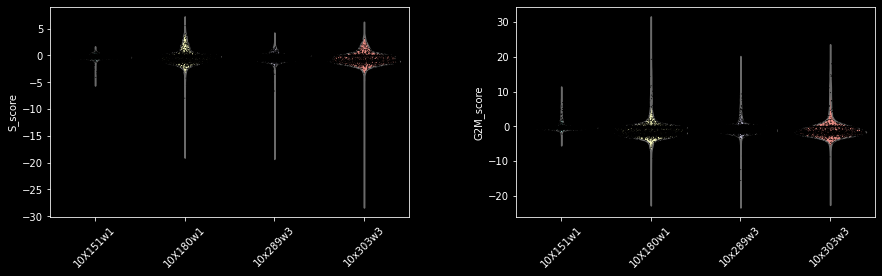

In [183]:
sc.pl.violin(adata, ['S_score', 'G2M_score'], jitter=0.4, groupby = 'sample_id', rotation=45)

In [186]:


# compute variable genes
sc.pp.highly_variable_genes(
    adata, n_top_genes=2000,
    inplace=True, batch_key="sample_id")
print("Highly variable genes: %d"%sum(adata.var.highly_variable))



/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:475: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:475: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:475: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Highly variable genes: 2000


/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:475: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/home/sebastian/anaconda3/envs/plankton-dev/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:510: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



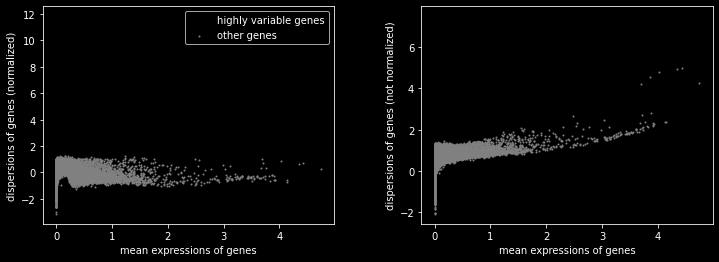

In [187]:


#plot variable genes
sc.pl.highly_variable_genes(adata)

# subset for variable genes in the dataset
adata = adata[:, adata.var['highly_variable']]



In [188]:
adata.var.highly_variable

HES4          True
TNFRSF4       True
HES5          True
LINC00982     True
MIR34AHG      True
              ... 
Z96074.1      True
SLITRK2       True
BGN           True
RPS4Y1        True
AC010737.1    True
Name: highly_variable, Length: 2000, dtype: bool

In [189]:


sc.tl.pca(
    data = adata, 
    svd_solver = 'arpack',
    n_comps = 50,
    use_highly_variable = True)



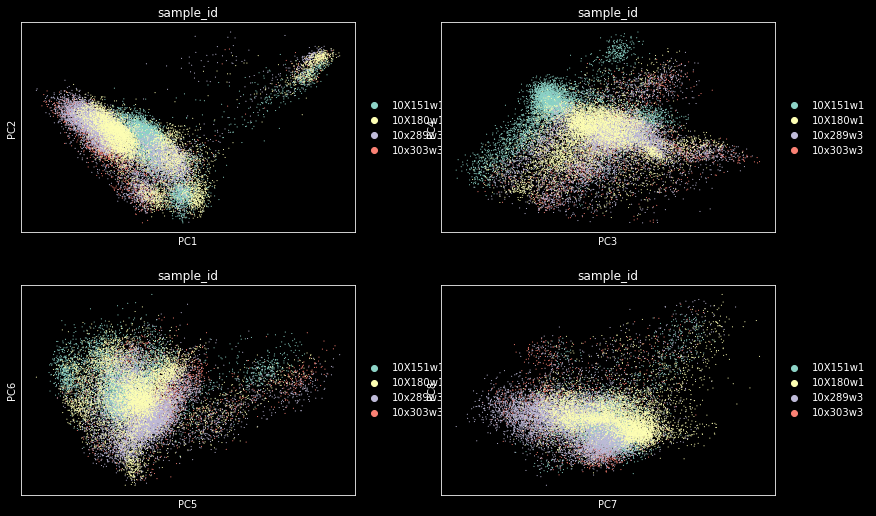

In [190]:
sc.pl.pca(adata, color='sample_id', components = ['1,2','3,4','5,6','7,8'], ncols=2)

In [191]:


os.makedirs('/home/sebastian/data/spatial-workshop/single_cell/results', exist_ok=True)
adata.write_h5ad('/home/sebastian/data/spatial-workshop/single_cell/results/single_cell_qc.h5ad')



In [4]:
adata = sc.read_h5ad('/home/sebastian/data/spatial-workshop/single_cell/results/single_cell_qc.h5ad')
adata

AnnData object with n_obs × n_vars = 24875 × 2000
    obs: 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'n_genes', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg', 'log1p', 'pca', 'sample_id_colors'
    obsm: 'X_pca'
    varm: 'PCs'

In [5]:


# split per batch into new objects.
batches = adata.obs['sample_id'].cat.categories.tolist()
alldata = {}
for batch in batches:
    alldata[batch] = adata[adata.obs['sample_id'] == batch,]



In [6]:
adatas = list(alldata.values())

In [7]:

scanorama.integrate_scanpy(
    adatas        = adatas,
    dimred        = 50)

Found 2000 genes among all datasets
[[0.         0.65026864 0.12618936 0.04595186]
 [0.         0.         0.77149093 0.34066488]
 [0.         0.         0.         0.95717412]
 [0.         0.         0.         0.        ]]
Processing datasets (2, 3)
Processing datasets (1, 2)
Processing datasets (0, 1)
Processing datasets (1, 3)
Processing datasets (0, 2)


In [8]:
adatas[0].obsm['X_scanorama'].shape

(6411, 50)

In [9]:


# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
adata.obsm["scanorama"] = all_s



(24875, 50)


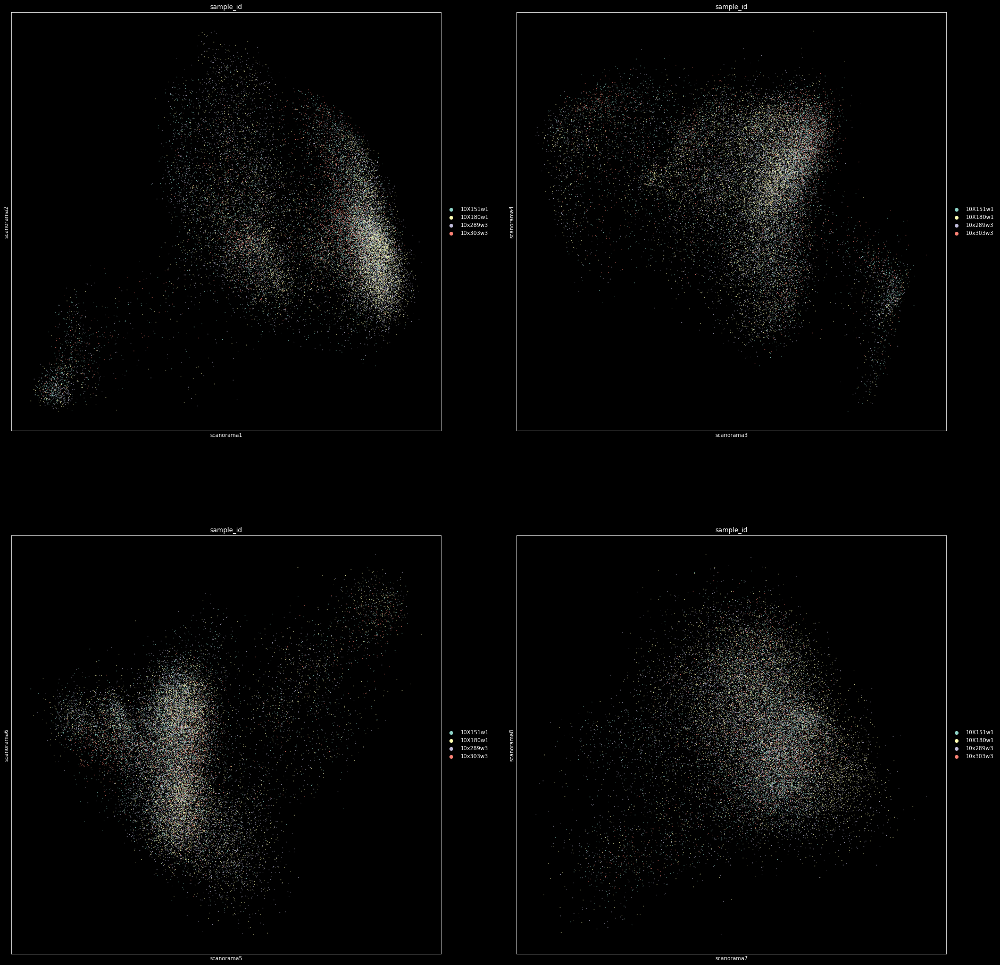

In [10]:
sc.pl.embedding(
    basis='scanorama',
    adata = adata,
    color='sample_id', 
    components = ['1,2','3,4','5,6','7,8'], 
    ncols=2)

In [11]:
resolutions = [0.4,0.6,0.8,0.9,1.0,1.1,1.2,1.4,1.6]

In [12]:
sc.pp.neighbors(adata, n_pcs = 30, n_neighbors = 20, use_rep='scanorama')

for i in resolutions:
#     sc.tl.louvain( adata, resolution = i, key_added = "louvain_"+str(i) )
    sc.tl.leiden(  adata, resolution = i, key_added = "leiden_"+str(i) )



In [14]:
adata.write_h5ad('/home/sebastian/data/spatial-workshop/single_cell/results/single_cell_qc.h5ad')
